# Outlier Analysis

Finally, we came to the last part of the project. In the first part, we gathered the data by creating a web scrapper.

The second part is where we performed the exploratory analysis to understand the data better and showcase trends in the data.

The third part, where we are, will perform the outlier analysis. We will do that by using the following methods:

- Elliptic Envelope
- Local Outlier Factor
- SVM
- Isolation Forest

We will evaluate the following features will be analyzed for outliers:

Features that will be analyzed
- Effective field goal percentage (eFG%)  => following feature combinations that will be analyzed (FG vs eFG%) & (PTS vs eFG%)
- True shooting percentage (TS%) => following feature combinations that will be analyzed (FG% vs TS%) & (PTS vs TS%)
- Player efficiency rating (PER) => following feature combinations that will be analyzed (G vs PER) & (GS vs PER)
- Field Goal & PTS => (FG vs 2P) & (FG vs 3P)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#importing the total data
pd.set_option('display.max_columns',100)
df=pd.read_csv(r"C:\Users\gandj\OneDrive\Desktop\Case Study\Basketball\Total_Stats_1997_2023.csv").iloc[:,1:]
df.head()

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,PG%,SG%,SF%,PF%,C%,OnCourt,On-Off,BadPass,LostBall,Shooting_Fouls_Committed,Offensive_Fouls_Committed,Shooting_Fouls_Drawn,Offensive_Fouls_Drawn,PGA,And1,Blkd,Year,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader,Starting%_float,Starting%_str,Decades
0,Mahmoud Abdul-Rauf,PG,27,Sacramento Kings,75,51,2131,411,924,0.445,94,246,0.382,317,678,0.468,0.496,115,136,0.846,16,106,122,189,56,6,119,174,1031,13.2,0.524,0.266,0.147,0.9,5.9,3.3,15.8,1.4,0.2,10.8,23.2,2.0,0.7,2.7,0.060,-0.8,-1.8,-2.6,-0.4,0.89,0.11,0.00,0.00,0.0,-5.9,-3.2,73,14,84,4,29,0,409,4,30,1997,0,0,0,0,0,0,0,0.680,68.0%,1990's
1,Shareef Abdur-Rahim,PF,20,Vancouver Grizzlies,80,71,2802,550,1214,0.453,7,27,0.259,543,1187,0.457,0.456,387,519,0.746,216,339,555,175,79,79,225,199,1494,17.4,0.518,0.022,0.428,8.8,14.2,11.5,12.1,1.5,2.2,13.5,27.6,1.7,1.2,2.9,0.049,0.3,-2.1,-1.8,0.2,0.00,0.00,0.35,0.64,0.0,-11.5,-3.9,85,58,88,27,220,0,387,51,162,1997,0,0,0,0,0,0,0,0.888,88.8%,1990's
2,Rafael Addison,SF,32,Charlotte Hornets,41,3,355,49,122,0.402,8,20,0.400,41,102,0.402,0.434,22,28,0.786,19,26,45,34,8,3,17,52,128,10.6,0.476,0.164,0.230,6.7,8.6,7.7,15.5,1.2,0.6,11.2,20.1,0.2,0.1,0.4,0.048,-2.6,-1.7,-4.4,-0.2,0.00,0.45,0.55,0.00,0.0,-3.3,-7.6,7,2,30,3,6,0,79,2,5,1997,0,0,0,0,0,0,0,0.073,7.3%,1990's
3,Cory Alexander,PG,23,San Antonio Spurs,80,6,1454,194,490,0.396,94,252,0.373,100,238,0.420,0.492,95,129,0.736,29,94,123,254,82,16,146,148,577,14.3,0.528,0.514,0.263,2.3,8.0,5.1,30.0,3.1,0.9,21.1,22.2,0.5,0.6,1.1,0.035,0.3,-0.8,-0.6,0.5,0.94,0.06,0.00,0.00,0.0,-9.7,-1.1,83,26,71,9,38,0,540,6,23,1997,0,0,0,0,0,0,0,0.075,7.5%,1990's
4,Jerome Allen,SG,24,more than 2 Teams,76,1,943,78,221,0.353,30,93,0.323,48,128,0.375,0.421,42,72,0.583,25,73,98,152,31,4,69,84,228,8.7,0.451,0.421,0.326,3.1,9.0,6.1,25.3,1.8,0.3,21.4,15.6,-0.3,0.8,0.4,0.021,-2.5,-0.2,-2.6,-0.1,0.72,0.25,0.02,0.00,0.0,-2.6,-1.8,50,4,25,6,27,0,346,5,15,1997,0,0,0,0,0,0,0,0.013,1.3%,1990's


In [3]:
#importing the average data
pd.set_option('display.max_columns',100)
df_avg=pd.read_csv(r"C:\Users\gandj\OneDrive\Desktop\Case Study\Basketball\Avg_Stats_1984_2023.csv").iloc[:,1:]
df_avg.head()

,Player,Pos,Age,Tm,G,GS,Played%,Started%,MP,Avg_MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Decades,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader
0,Kareem Abdul-Jabbar,C,36,Los Angeles Lakers,80,80,0.98,1.00,2622,33.0,9.8,17.0,0.578,0.0,0.0,0.000,9.8,17.0,0.579,3.9,5.4,0.723,2.3,5.7,8.1,2.9,0.8,2.0,3.0,2.9,23.6,1984,1980's,0,0,0,0,0,0,0
1,Alvan Adams,C,29,Phoenix Suns,70,13,0.85,0.19,1452,21.0,6.7,14.4,0.462,0.0,0.1,0.000,6.7,14.3,0.465,3.3,4.0,0.825,2.9,5.0,7.9,5.4,1.8,0.8,2.9,4.8,16.6,1984,1980's,0,0,0,0,0,0,0
2,Mark Aguirre,SF,24,Dallas Mavericks,79,79,0.96,1.00,2900,37.0,11.5,21.9,0.524,0.2,0.7,0.268,11.3,21.2,0.532,5.8,7.7,0.749,2.0,3.8,5.8,4.4,1.0,0.3,3.5,3.1,28.9,1984,1980's,0,0,0,0,0,0,0
3,Danny Ainge,SG,24,Boston Celtics,71,3,0.87,0.04,1154,16.0,5.2,11.3,0.460,0.2,0.7,0.273,5.0,10.6,0.472,1.4,1.7,0.821,0.9,2.7,3.6,5.1,1.3,0.1,2.2,4.5,12.0,1984,1980's,1,0,0,0,0,0,0
4,J.J. Anderson,SF,23,Utah Jazz,48,0,0.59,0.00,311,6.0,6.4,15.0,0.423,0.0,0.3,0.000,6.4,14.7,0.433,1.4,3.4,0.414,4.4,2.9,7.3,2.5,1.7,1.0,2.3,3.2,14.1,1984,1980's,0,0,0,0,0,0,0


Before building the models, I will showcase the different feature combinations and how they interact. To do that, I will create two different for-loops, in which I will create two different jointplots, one for the total and one for the average data.

C:\Users\gandj\AppData\Local\Temp\ipykernel_72616\3552042990.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,8))


<Figure size 1000x800 with 0 Axes>

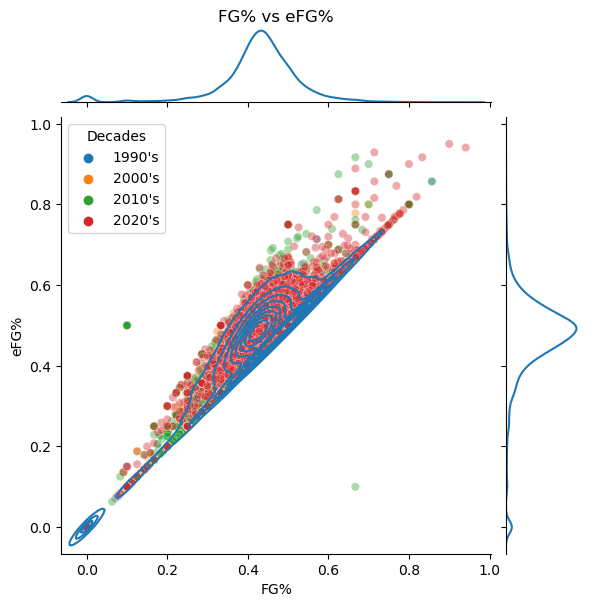

<Figure size 1000x800 with 0 Axes>

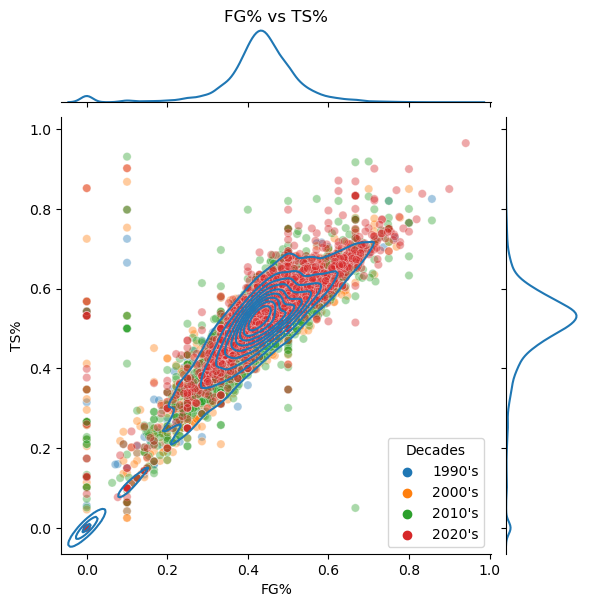

<Figure size 1000x800 with 0 Axes>

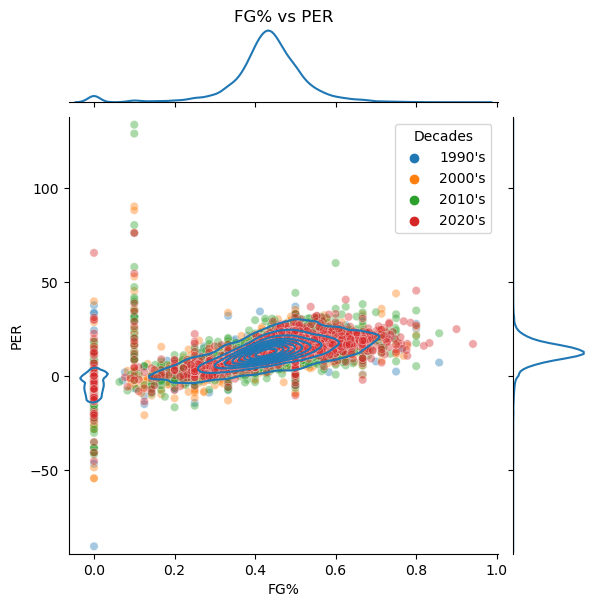

<Figure size 1000x800 with 0 Axes>

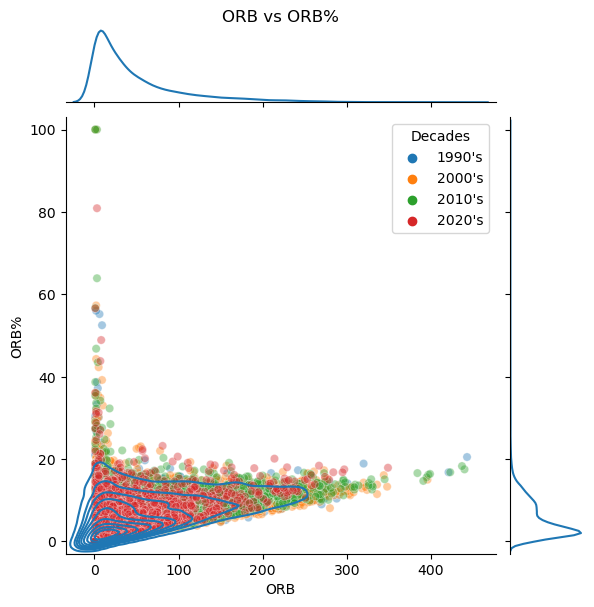

<Figure size 1000x800 with 0 Axes>

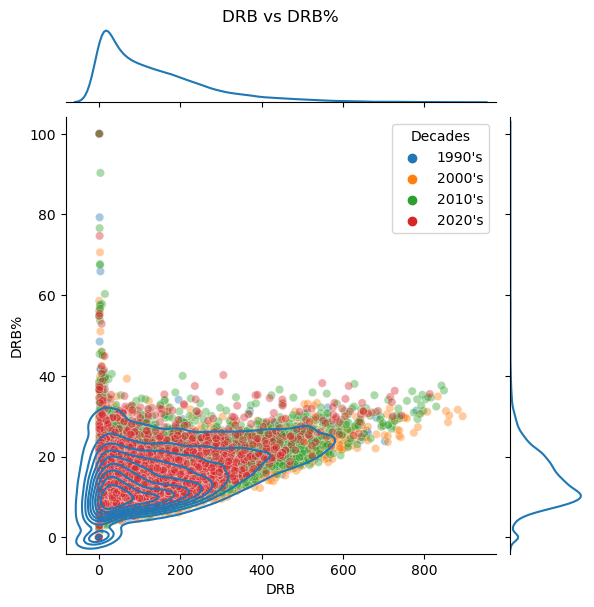

<Figure size 1000x800 with 0 Axes>

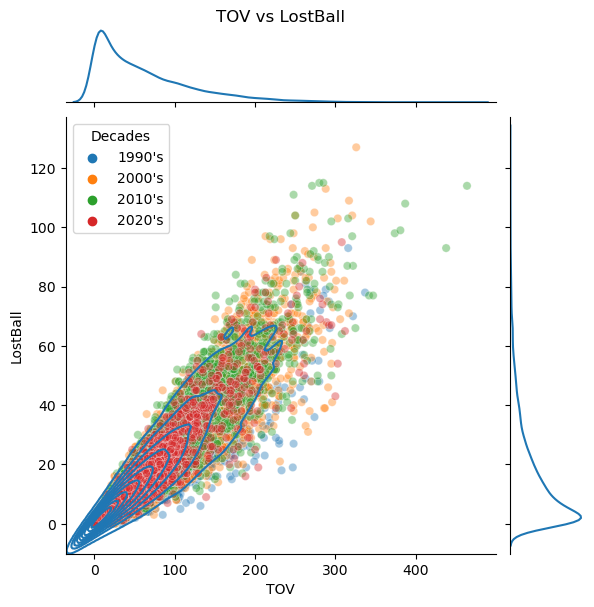

<Figure size 1000x800 with 0 Axes>

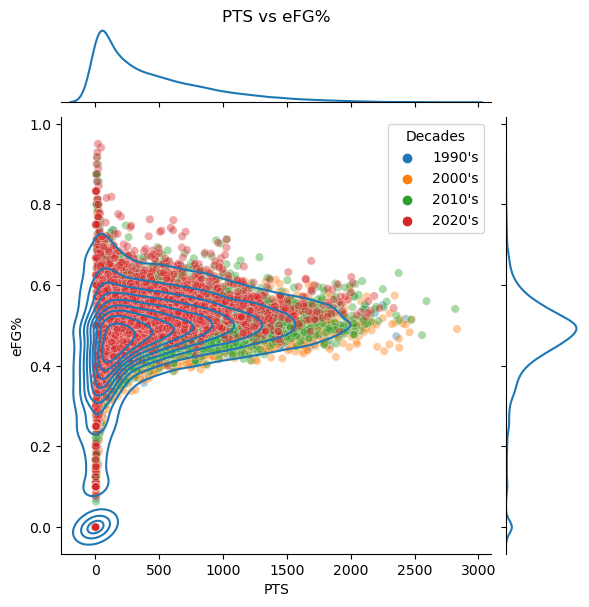

<Figure size 1000x800 with 0 Axes>

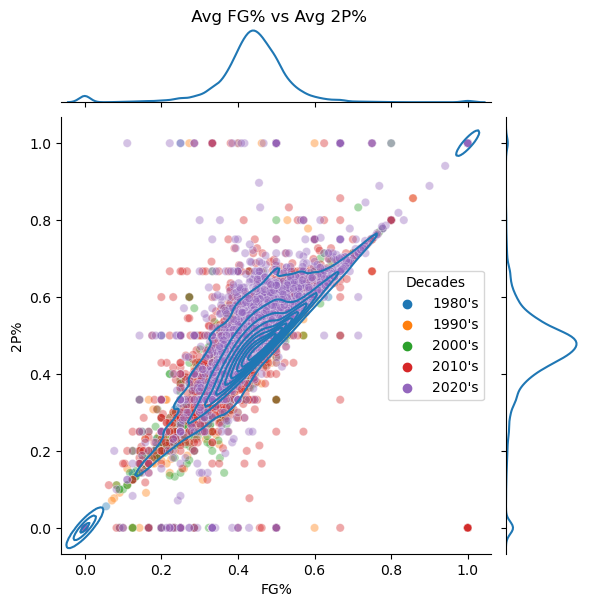

<Figure size 1000x800 with 0 Axes>

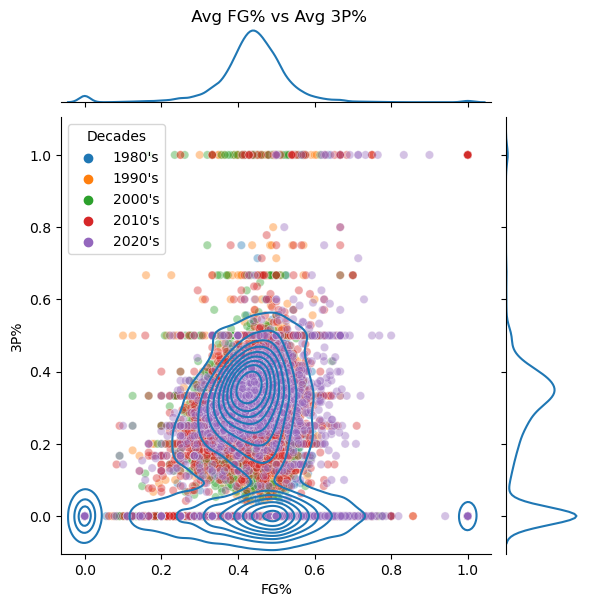

<Figure size 1000x800 with 0 Axes>

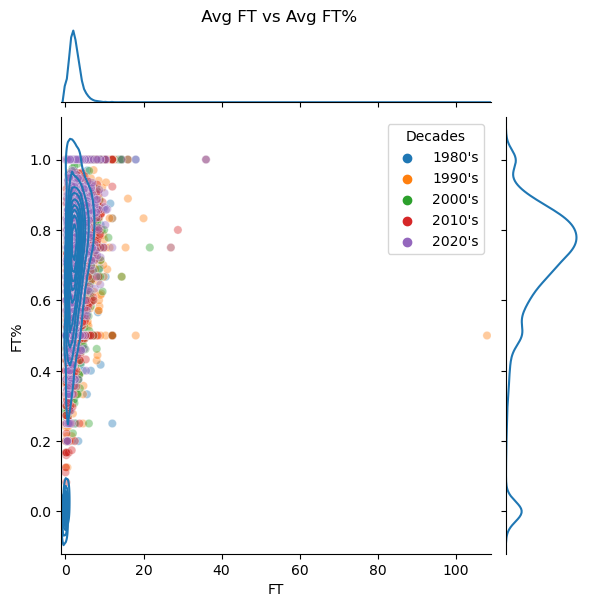

<Figure size 1000x800 with 0 Axes>

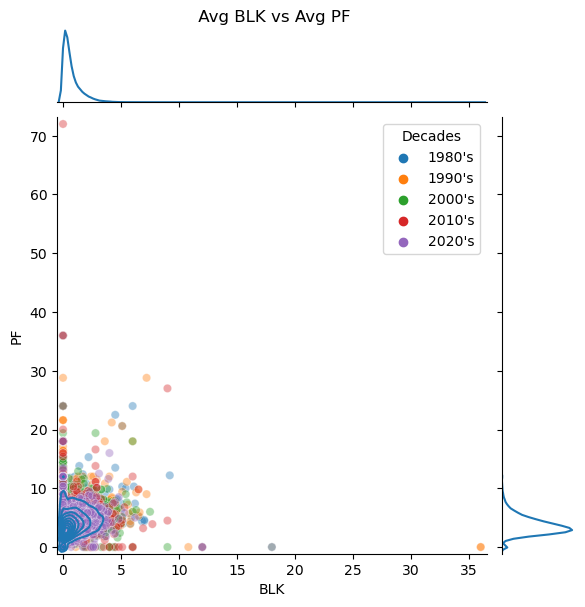

<Figure size 1000x800 with 0 Axes>

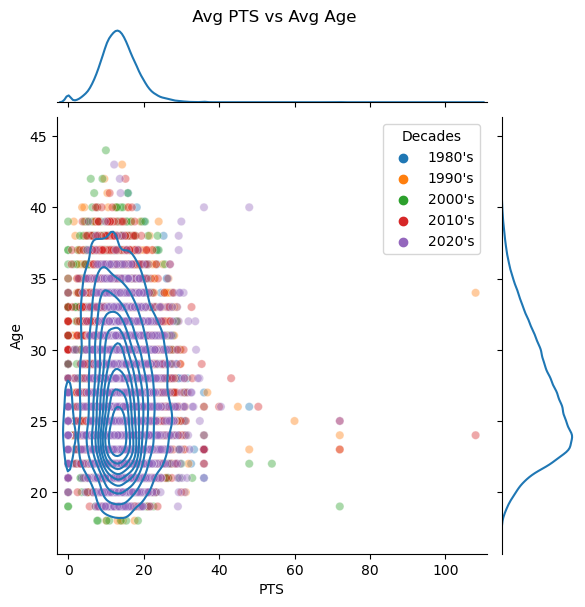

In [ ]:
total_lst=[['FG%','eFG%'],['FG%','TS%'],['FG%','PER'],['ORB','ORB%'],['DRB','DRB%'],['TOV','LostBall'],['PTS','eFG%']]
avg_lst=[['FG%','2P%'],['FG%','3P%'],['FT','FT%'],['BLK','PF'],['PTS','Age']]
awards_total_lst=list(df.columns[-10:-3])

for total in total_lst:
    plt.figure(figsize=(10,8))
    sns.jointplot(x=total[0],y=total[1],data=df,kind='kde')
    plt.title("{} vs {}".format(total[0],total[1]),y=1.2)
    sns.scatterplot(x=total[0],y=total[1],data=df,hue='Decades',alpha=0.4)

for avg in avg_lst:
    plt.figure(figsize=(10,8))
    sns.jointplot(x=avg[0],y=avg[1],data=df_avg,kind='kde')
    plt.title(" Avg {} vs Avg {}".format(avg[0],avg[1]),y=1.2)
    sns.scatterplot(x=avg[0],y=avg[1],data=df_avg,hue='Decades',alpha=0.4)

One thing becomes apparent by plotting the joint plots with the different features: we need to separate the different decades. Specifically, we need to split the data set into the old NBA (1990s & 2000s) and modern NBA (2010s & 2020s).

Otherwise, we would detect outliers only because the game has evolved; the decades in the old and, respectively, modern NBA tend to be very similar and, therefore, allow us to find true outliers. We primarily focus on the modern NBA data to make the analysis more relatable.

It is important to mention that the kde feature allows us to get a first idea of where outliers could be located; our goal is to see where the actual outliers are and whether our outcome will match the kde plot.

In [4]:
#creating the new total data sets and filter down to just the columns that we need
df_old=df[(df['Decades']=="1990's") | (df['Decades']=="2000's")]
df_modern=df[(df['Decades']=="2010's") | (df['Decades']=="2020's")]
print(len(df_old))
print(len(df_modern))

7070
8981


In [5]:
#creating the new average data sets and filter down to just the columns that we need
df_avg_old=df_avg[(df_avg['Decades']=="1980's") | (df_avg['Decades']=="1990's") | (df_avg['Decades']=="2000's")]
df_avg_modern=df_avg[(df_avg['Decades']=="2010's") | (df_avg['Decades']=="2020's")]
print(len(df_avg_old))
print(len(df_avg_modern))

12681
8981


C:\Users\gandj\AppData\Local\Temp\ipykernel_37704\1815681556.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,8))


<Figure size 1000x800 with 0 Axes>

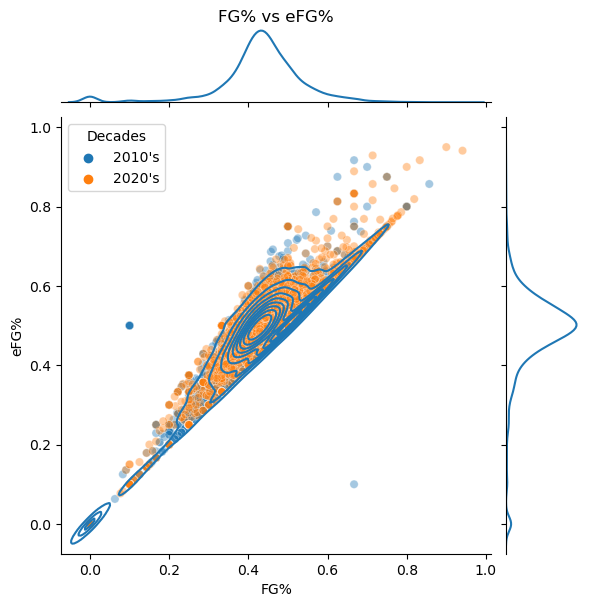

<Figure size 1000x800 with 0 Axes>

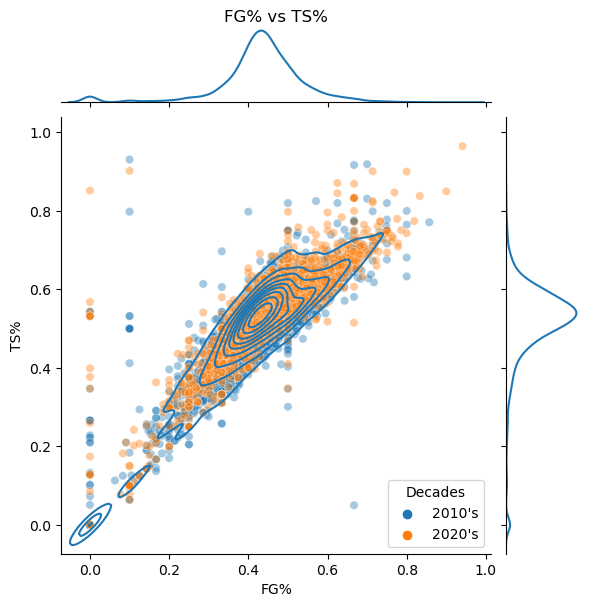

<Figure size 1000x800 with 0 Axes>

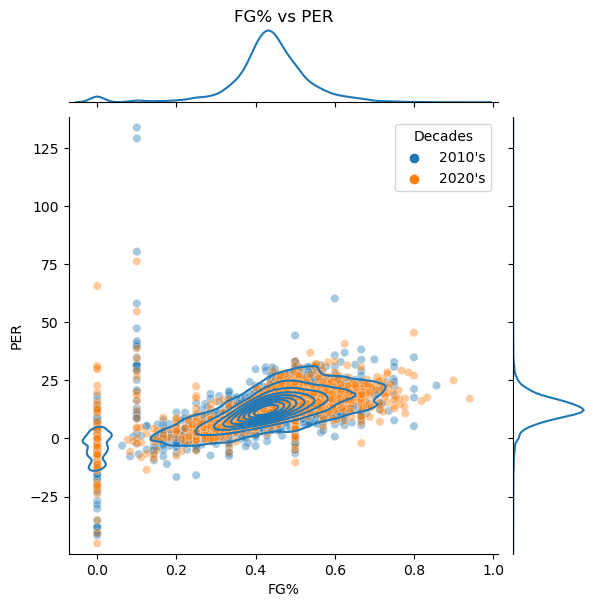

<Figure size 1000x800 with 0 Axes>

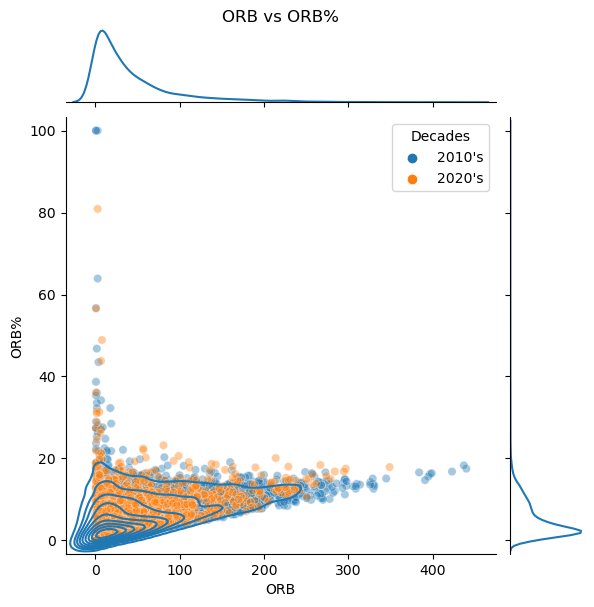

<Figure size 1000x800 with 0 Axes>

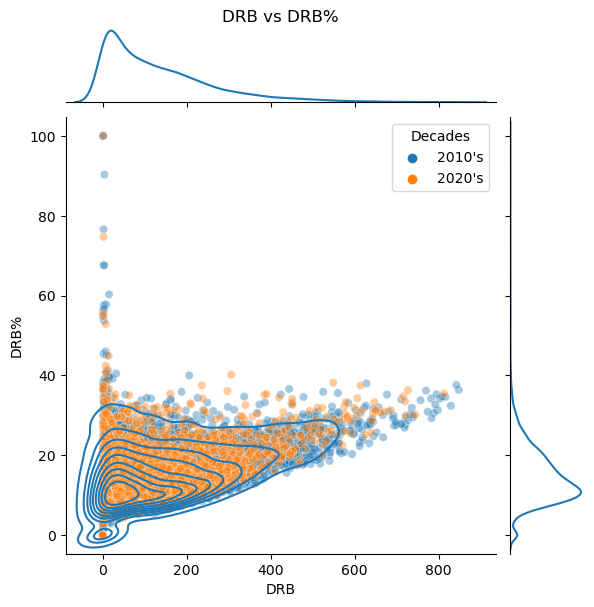

<Figure size 1000x800 with 0 Axes>

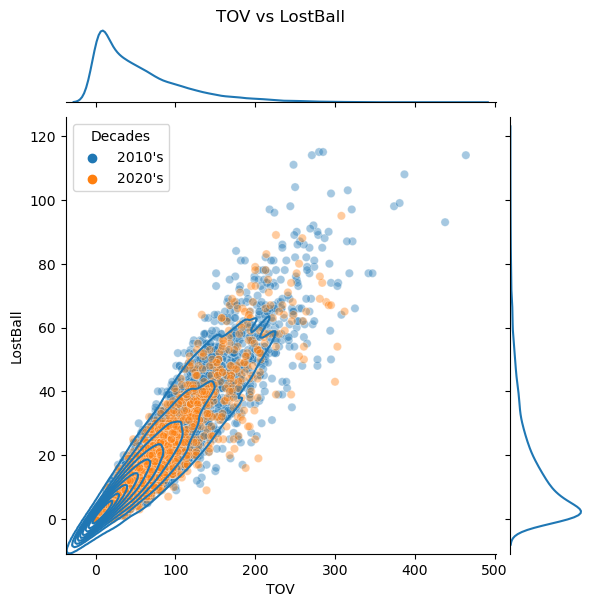

<Figure size 1000x800 with 0 Axes>

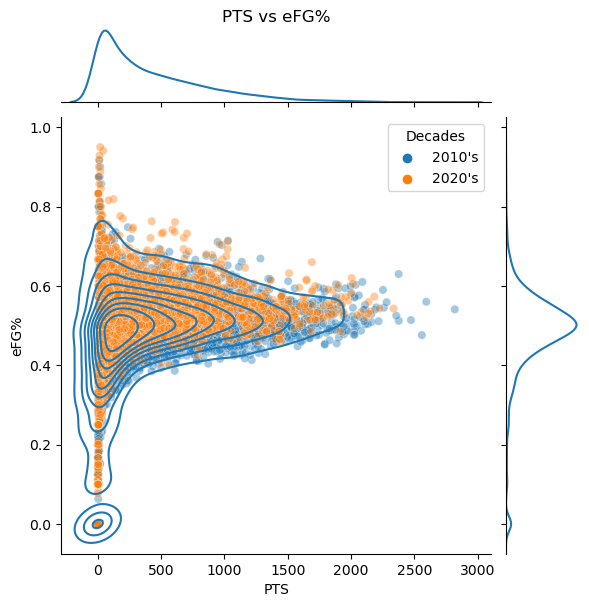

<Figure size 1000x800 with 0 Axes>

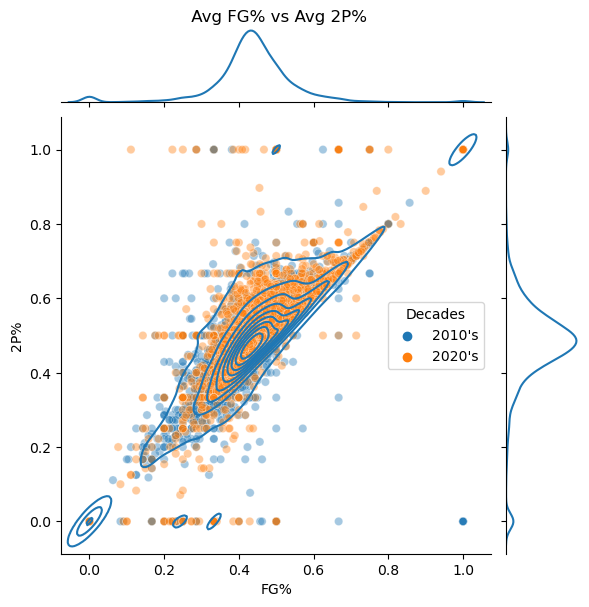

<Figure size 1000x800 with 0 Axes>

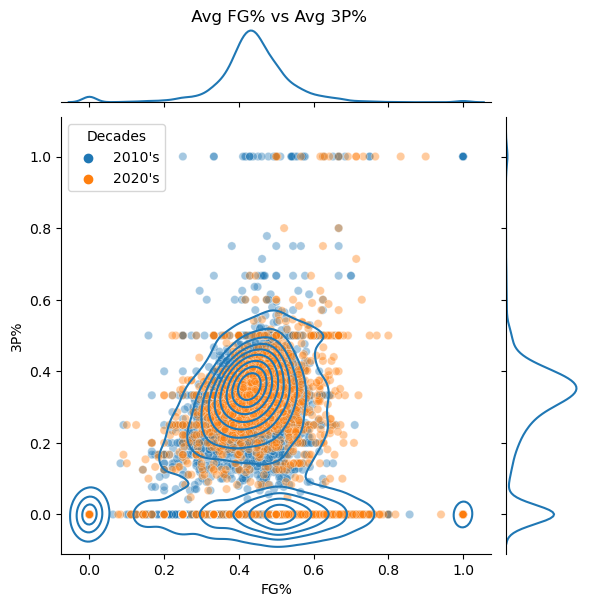

<Figure size 1000x800 with 0 Axes>

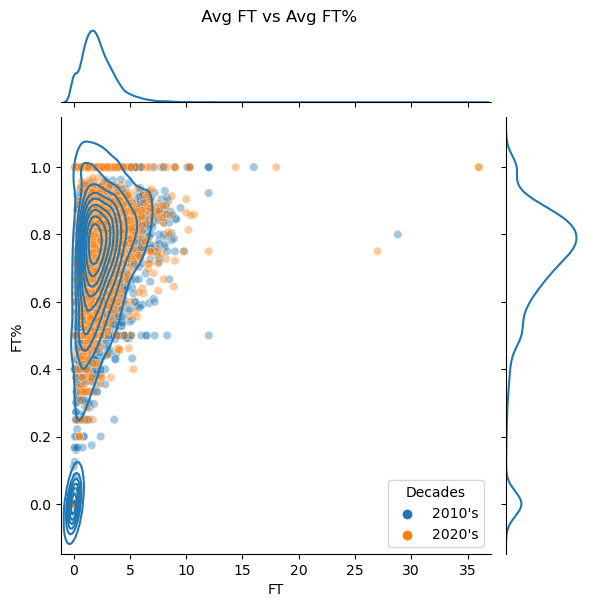

<Figure size 1000x800 with 0 Axes>

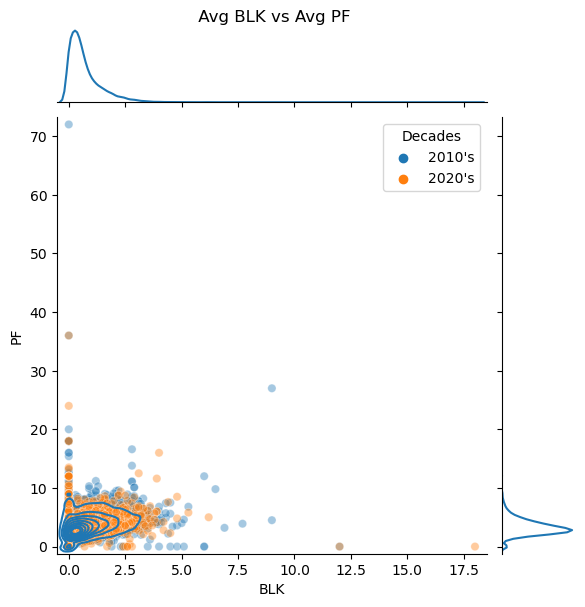

<Figure size 1000x800 with 0 Axes>

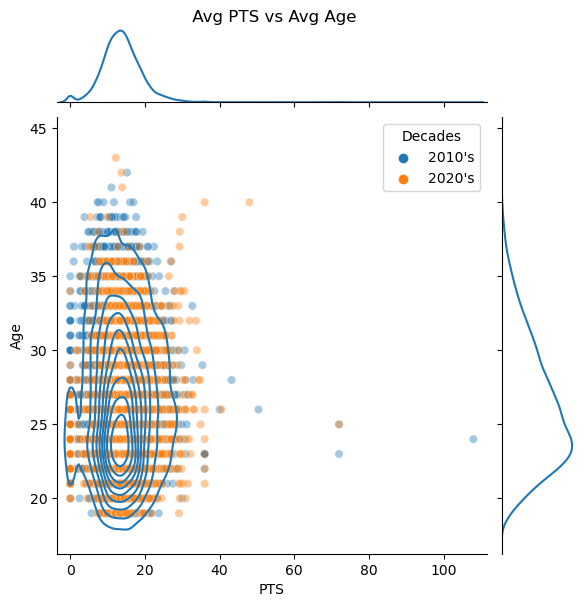

In [6]:
#here we create the same visualization, but with the new data sets, which only represent the modern NBA
total_lst=[['FG%','eFG%'],['FG%','TS%'],['FG%','PER'],['ORB','ORB%'],['DRB','DRB%'],['TOV','LostBall'],['PTS','eFG%']]
avg_lst=[['FG%','2P%'],['FG%','3P%'],['FT','FT%'],['BLK','PF'],['PTS','Age']]
awards_total_lst=list(df.columns[-10:-3])

for total in total_lst:
    plt.figure(figsize=(10,8))
    sns.jointplot(x=total[0],y=total[1],data=df_modern,kind='kde')
    plt.title("{} vs {}".format(total[0],total[1]),y=1.2)
    sns.scatterplot(x=total[0],y=total[1],data=df_modern,hue='Decades',alpha=0.4)

for avg in avg_lst:
    plt.figure(figsize=(10,8))
    sns.jointplot(x=avg[0],y=avg[1],data=df_avg_modern,kind='kde')
    plt.title(" Avg {} vs Avg {}".format(avg[0],avg[1]),y=1.2)
    sns.scatterplot(x=avg[0],y=avg[1],data=df_avg_modern,hue='Decades',alpha=0.4)

After dividing the data into the old and modern NBA, we are dealing with much more representative data sets.

Next, we need to check the distributions of each feature; this is due to the support vector machine we will be using. When we analyse the joint plots, we see that our data is not normally distributed and (might) have outliers. Therefore, we will use the robust scaler.

We will first perform a test run with the combination "FG% vs eFG%" to showcase one run step by step (note=> one run means we will test all models to find the best model for the particular combination).

## Building the Models

### Elliptic Envelope

In [6]:
#combining the two features to one array
X=df_modern[['FG%','eFG%']].values
print('Correlation level between FG% & eFG%: {}'.format(round(df[['FG%','eFG%']].corr().iloc[1,0],4)))
print('\n')
print('Descriptive Statistics for the two features')
print(df[['FG%','eFG%']].describe())

#by analysing the correlation level and descriptive statistics, we see a strong correlation level and
#most certainly a small difference in the variance. Therefore, we will decide between the distance metrics
#Euclidean and Manhattan

Correlation level between FG% & eFG%: 0.9235


Descriptive Statistics for the two features
                FG%          eFG%
count  16051.000000  16051.000000
mean       0.426947      0.468800
std        0.105357      0.110492
min        0.000000      0.000000
25%        0.392000      0.437000
50%        0.434000      0.484000
75%        0.479000      0.525000
max        0.941000      0.950000


In [7]:
#I'll leave it here for later=> for the def function
#this code will check how big the difference in std is, which indicates how big the difference in variance is/might be
df[['FG%','eFG%']].describe().iloc[2,:].diff().iloc[1]

0.005134675566232663

<Axes: >

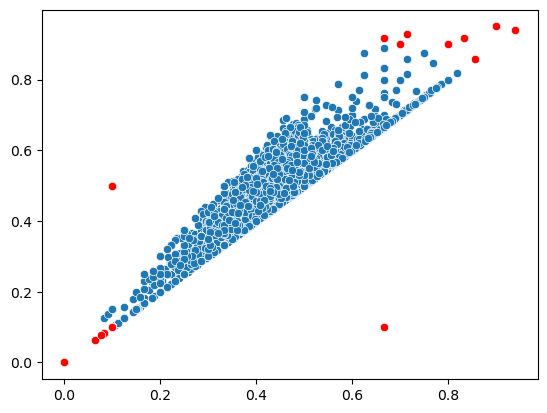

In [8]:
from sklearn.covariance import EllipticEnvelope

#contamination=0.025=> only 2.5% of the data should be considered as outliers
elliptic=EllipticEnvelope(contamination=0.025, random_state=101).fit(X)

elliptic_pred=elliptic.predict(X)
outlier_index=np.where(elliptic_pred==-1)
outlier_values=X[outlier_index]

sns.scatterplot(x=X[:,0],y=X[:,1])
sns.scatterplot(x=outlier_values[:,0],y=outlier_values[:,1],color='r')

In [9]:
#creating the new data frame
df_PTS_eFG=df_modern
df_PTS_eFG['outlier_score_elliptic_PTS_eFG%']=elliptic.decision_function(X)
df_PTS_eFG['outlier_score_elliptic_PTS_eFG%']=df_PTS_eFG['outlier_score_elliptic_PTS_eFG%'].rank()
df_PTS_eFG.sort_values('outlier_score_elliptic_PTS_eFG%',ascending=True)

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2057205999.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_elliptic_PTS_eFG%']=elliptic.decision_function(X)
C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2057205999.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_elliptic_PTS_eFG%']=df_PTS_eFG['outlier_score_elliptic_PTS_eFG%'].rank()


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,PG%,SG%,SF%,PF%,C%,OnCourt,On-Off,BadPass,LostBall,Shooting_Fouls_Committed,Offensive_Fouls_Committed,Shooting_Fouls_Drawn,Offensive_Fouls_Drawn,PGA,And1,Blkd,Year,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader,Starting%_float,Starting%_str,Decades,outlier_score_elliptic_PTS_eFG%
12403,David Stockton,PG,26,Utah Jazz,3,0,9,2,3,0.667,2,3,0.667,0,0,0.000,0.100,4,4,0.100,0,0,0,0,0,0,1,3,10,33.9,0.050,0.100,0.333,0.0,0.0,0.0,0.0,0.0,0.0,17.4,28.8,0.1,0.0,0.1,0.459,6.7,1.1,7.9,0.0,1.00,0.00,0.00,0.00,0.00,-55.0,-59.9,1,0,3,0,1,0,0,0,0,2018,0,0,0,0,0,0,0,0.000,0.0%,2010's,1.0
15229,Chris Silva,PF,25,Minnesota Timberwolves,1,0,3,0,0,0.000,0,0,0.000,0,0,0.000,0.000,0,0,0.000,0,1,1,0,0,0,0,0,0,3.8,0.000,0.000,0.000,0.0,36.6,17.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.052,-5.3,-0.5,-5.8,0.0,0.00,0.00,0.00,0.00,1.00,-75.0,-77.5,0,0,0,0,0,0,0,0,0,2022,0,0,0,0,0,0,0,0.000,0.0%,2020's,96.0
10782,Sam Dekker,PF,21,Houston Rockets,3,0,6,0,0,0.000,0,0,0.000,0,0,0.000,0.000,0,0,0.000,0,1,1,0,1,0,0,0,0,10.8,0.000,0.000,0.000,0.0,18.5,9.2,0.0,8.2,0.0,0.0,0.0,0.0,0.0,0.0,0.116,-2.8,5.1,2.2,0.0,0.00,0.00,0.00,0.24,0.76,-5.2,-5.3,0,0,0,0,0,0,0,0,0,2016,0,0,0,0,0,0,0,0.000,0.0%,2010's,96.0
15318,M.J. Walker,SG,23,Phoenix Suns,2,0,8,0,4,0.000,0,2,0.000,0,2,0.000,0.000,0,0,0.000,0,1,1,1,2,0,0,1,0,-3.3,0.000,0.500,0.000,0.0,13.1,6.7,13.8,12.0,0.0,0.0,21.5,-0.1,0.0,0.0,-0.276,-15.8,6.2,-9.6,0.0,0.00,0.65,0.35,0.00,0.00,-11.7,-19.5,0,0,0,0,0,0,2,0,1,2022,0,0,0,0,0,0,0,0.000,0.0%,2020's,96.0
10802,James Ennis III,SF,25,Miami Heat,3,0,7,0,0,0.000,0,0,0.000,0,0,0.000,0.000,0,0,0.000,0,0,0,1,0,0,0,1,0,2.4,0.000,0.000,0.000,0.0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.070,-4.0,2.2,-1.8,0.0,0.00,0.00,1.00,0.00,0.00,0.0,-2.0,0,0,1,0,0,0,2,0,0,2016,0,0,0,0,0,0,0,0.000,0.0%,2010's,96.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8928,Mike Conley,PG,25,Memphis Grizzlies,80,80,2757,414,940,0.440,106,293,0.362,308,647,0.476,0.497,234,282,0.830,43,182,225,487,174,24,189,171,1168,18.3,0.549,0.312,0.300,1.8,7.9,4.8,29.5,3.4,0.7,15.1,21.0,5.1,4.7,9.9,0.172,2.3,2.3,4.6,4.6,1.00,0.00,0.00,0.00,0.00,9.6,16.1,120,51,69,9,98,26,1035,30,50,2013,0,0,0,0,0,0,0,1.000,100.0%,2010's,8976.5
9197,Anthony Morrow,SG,27,more than 2 Teams,41,1,383,64,145,0.441,16,43,0.372,48,102,0.471,0.497,20,22,0.909,11,19,30,13,13,1,8,43,164,12.0,0.530,0.297,0.152,3.3,5.6,4.5,5.6,1.8,0.2,4.9,19.6,0.4,0.3,0.7,0.084,-1.9,0.0,-1.8,0.0,0.00,0.49,0.51,0.00,0.00,-6.5,-7.2,5,2,23,0,7,1,31,2,8,2013,0,0,0,0,0,0,0,0.024,2.4%,2010's,8979.5
8270,Nick Young,SG,25,Washington Wizards,64,40,2034,412,935,0.441,105,271,0.387,307,664,0.462,0.497,186,228,0.816,26,148,174,75,45,17,90,144,1115,14.5,0.538,0.290,0.244,1.4,8.6,4.9,6.6,1.1,0.6,8.0,24.4,2.3,0.4,2.8,0.065,0.6,-1.8,-1.3,0.4,0.01,0.76,0.23,0.00,0.00,-8.0,0.2,21,32,75,18,93,12,164,17,30,2011,0,0,0,0,0,0,0,0.625,62.5%,2010's,8979.5
15969,Cam Thomas,SG,21,Brooklyn Nets,57,4,948,201,456,0.441,51,133,0.383,150,323,0.464,0.497,151,174,0.868,8,87,95,78,20,7,63,55,604,14.7,0.567,0.292,0.382,1.0,10.1,5.6,12.7,1.0,0.6,10.6,27.8,0.3,0.7,1.0,0.049,-0.7,-2.0,-2.7,-0.2,0.09,0.56,0.32,0.03,0.00,-1.3,-3.3,22,18,32,4,76,10,187,18,14,2023,0,0,0,0,0,0,0,0.070,7.000000000000001%,2020's,8979.5


In [10]:
#evaluating the model
from sklearn.metrics import silhouette_score

s_score_elliptic=round(silhouette_score(X,elliptic_pred),5)
print("Silhouette score for the elliptic model is: {}".format(s_score_elliptic))

Silhouette score for the elliptic model is: 0.77007


### Local Outlier Factor

The Local Outlier Factor's most important parameters are:
- n_neighbors=> we will test with a for loop the different values and compare the silhouette scores
- algorithm=> we will use auto because it will help us to find the most appropriate algorithm
- leaf_size=> we will test with a for loop the different values and compare the silhouette scores
- metric=> we will test with a for loop the different values and compare the silhouette scores
- contamination=> we will stick with our value of 0.025

In [ ]:
#setting up self created hyperparameter tunning loop
from sklearn.neighbors import LocalOutlierFactor
first_param_n_neighbor=[]
second_leaf_sizes=[]
third_metric=[]

best_score=[]
for n_neighbor in np.linspace(5,200,7,dtype=int):
    for leaf_sizes in np.linspace(5,200,7,dtype=int):
        for metrics in ['euclidean','manhattan']:
            LOF_pred=LocalOutlierFactor(n_neighbors=n_neighbor,algorithm='auto',
                                        leaf_size=leaf_sizes,metric=metrics,contamination=0.025,novelty=False).fit_predict(X)
            best_score.append(round(silhouette_score(X,LOF_pred),5))
            first_param_n_neighbor.append(n_neighbor)
            second_leaf_sizes.append(leaf_sizes)
            third_metric.append(metrics)

best_value=best_score.index(max(best_score))

print('The best score based on following parameter: {}'.format(max(best_score)))
print('\n')
print('Best value for the n_neighbor hyperparameter: {}'.format(first_param_n_neighbor[best_value]))
print('\n')
print('Best value for the leaf_size hyperparameter: {}'.format(second_leaf_sizes[best_value]))
print('\n')
print('Best value for the metric hyperparameter: {}'.format(third_metric[best_value]))

The best score based on following parameter: 0.56668


Best value for the n_neighbor hyperparameter: 167


Best value for the leaf_size hyperparameter: 5


Best value for the metric hyperparameter: manhattan


In [11]:
from sklearn.neighbors import LocalOutlierFactor
LOF_pred=LocalOutlierFactor(n_neighbors=167,algorithm='auto',
                                        leaf_size=5,metric='manhattan',contamination=0.025,novelty=False).fit_predict(X)
s_score_LOF=round(silhouette_score(X,LOF_pred),5)
print("Silhouette score for the Local Outlier Factor model is: {}".format(s_score_LOF))

Silhouette score for the Local Outlier Factor model is: 0.56668


<Axes: >

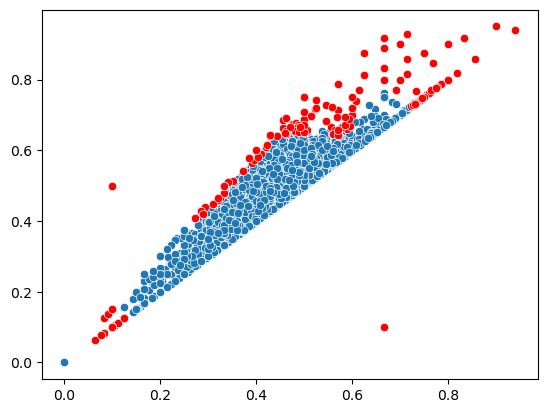

In [12]:
outlier_index=np.where(LOF_pred==-1)
outlier_values=X[outlier_index]

sns.scatterplot(x=X[:,0], y=X[:,1])
sns.scatterplot(x=outlier_values[:,0], y=outlier_values[:,1], color='r')

In [13]:
LOF=LocalOutlierFactor(n_neighbors=167,algorithm='auto',
                                        leaf_size=5,metric='manhattan',contamination=0.025,novelty=True).fit(X)
df_PTS_eFG['outlier_score_LOF_PTS_eFG%']=LOF.decision_function(X)
df_PTS_eFG['outlier_score_LOF_PTS_eFG%']=df_PTS_eFG['outlier_score_LOF_PTS_eFG%'].rank()
df_PTS_eFG.head()

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2777230432.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_LOF_PTS_eFG%']=LOF.decision_function(X)
C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2777230432.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_LOF_PTS_eFG%']=df_PTS_eFG['outlier_score_LOF_PTS_eFG%'].rank()


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,PG%,SG%,SF%,PF%,C%,OnCourt,On-Off,BadPass,LostBall,Shooting_Fouls_Committed,Offensive_Fouls_Committed,Shooting_Fouls_Drawn,Offensive_Fouls_Drawn,PGA,And1,Blkd,Year,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader,Starting%_float,Starting%_str,Decades,outlier_score_elliptic_PTS_eFG%,outlier_score_LOF_PTS_eFG%
7070,Arron Afflalo,SG,24,Denver Nuggets,82,75,2221,272,585,0.465,108,249,0.434,164,336,0.488,0.557,72,98,0.735,59,193,252,138,46,30,74,225,724,10.9,0.576,0.426,0.168,3.1,9.9,6.5,9.3,1.0,1.0,10.5,14.0,2.8,1.4,4.3,0.092,-0.2,-0.2,-0.4,0.9,0.0,0.92,0.07,0.00,0.00,3.6,-1.5,20,19,121,11,47,9,297,12,50,2010,0,0,0,0,0,0,0,0.915,91.5%,2010's,5398.5,5022.5
7071,Alexis Ajinça,C,21,Charlotte Bobcats,6,0,30,5,10,0.500,0,0,0.000,5,10,0.500,0.500,0,1,0.000,1,3,4,0,1,1,2,5,10,6.3,0.479,0.000,0.100,4.1,11.8,8.0,0.0,1.8,2.7,16.1,19.3,-0.1,0.0,0.0,-0.013,-6.3,1.0,-5.3,0.0,0.0,0.00,0.00,0.00,1.00,10.6,9.1,0,0,2,1,1,2,0,1,1,2010,0,0,0,0,0,0,0,0.000,0.0%,2010's,4106.0,8909.0
7072,LaMarcus Aldridge,PF,24,Portland Trail Blazers,78,78,2922,579,1169,0.495,5,16,0.313,574,1153,0.498,0.497,230,304,0.757,192,435,627,160,67,48,104,231,1393,18.2,0.535,0.014,0.260,8.1,18.6,13.3,9.9,1.3,1.3,7.4,22.9,5.5,3.3,8.8,0.145,1.4,-0.2,1.2,2.3,0.0,0.00,0.00,0.88,0.12,4.9,3.6,31,27,129,30,144,12,370,38,42,2010,0,0,0,0,0,0,0,1.000,100.0%,2010's,4506.0,5845.0
7073,Joe Alexander,SF,23,Chicago Bulls,8,0,29,1,6,0.167,0,1,0.000,1,5,0.200,0.167,2,3,0.667,2,3,5,2,1,1,0,9,4,2.8,0.273,0.167,0.500,7.8,11.3,9.6,9.3,1.8,2.6,0.0,11.3,0.0,0.0,0.0,0.030,-9.1,0.9,-8.3,0.0,0.0,0.00,0.86,0.14,0.00,-18.9,-17.5,0,0,5,0,0,0,4,0,0,2010,0,0,0,0,0,0,0,0.000,0.0%,2010's,303.5,511.5
7074,Malik Allen,PF,31,Denver Nuggets,51,3,456,46,116,0.397,1,6,0.167,45,110,0.409,0.401,12,13,0.923,36,46,82,16,11,5,22,68,105,5.9,0.431,0.052,0.112,9.2,11.5,10.4,5.1,1.2,0.8,15.3,14.0,-0.3,0.3,0.1,0.009,-4.7,-1.0,-5.7,-0.4,0.0,0.00,0.00,0.50,0.50,-12.9,-19.2,8,7,37,4,6,2,40,1,4,2010,0,0,0,0,0,0,0,0.059,5.8999999999999995%,2010's,2577.0,2068.0


### One-Class SVM Algorithm

It is important to mention that the One-Class SVM algorithm performs better for novelty detection than outlier detection. Let's start preparing the data because we use a support vector machine and need to scale the data.

In [ ]:
from sklearn.preprocessing import RobustScaler
#scaling the data
X_scaled=RobustScaler().fit_transform(X)

from sklearn.svm import OneClassSVM
#again we will build our own hyperparameter tuning loop
param_kernel=[]
param_degree=[]
param_gamma=[]
param_tol=[]
param_nu=[]
best_score_svm=[]

for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
    for degree in np.linspace(1,5,1,dtype=int):
        for gamma in ['auto','scale']:
            for tol in np.linspace(0.0001,0.1,5,dtype=float):
                for nu in np.linspace(0.1,0.5,5,dtype=float):
                    SVM_Class=OneClassSVM(kernel=kernel, degree=degree, gamma=gamma, tol=tol, nu=nu).fit_predict(X_scaled)
                    best_score_svm.append(round(silhouette_score(X,SVM_Class),5))
                    param_kernel.append(kernel)
                    param_degree.append(degree)
                    param_gamma.append(gamma)
                    param_tol.append(tol)
                    param_nu.append(nu)

best_value_svm=best_score_svm.index(max(best_score_svm))

print('The best score based on following parameter: {}'.format(max(best_score_svm)))
print('\n')
print('Best value for the kernel hyperparameter: {}'.format(param_kernel[best_value_svm]))
print('\n')
print('Best value for the degree hyperparameter: {}'.format(param_degree[best_value_svm]))
print('\n')
print('Best value for the gamma hyperparameter: {}'.format(param_gamma[best_value_svm]))
print('\n')
print('Best value for the tol hyperparameter: {}'.format(param_tol[best_value_svm]))
print('\n')
print('Best value for the nu hyperparameter: {}'.format(param_nu[best_value_svm]))

The best score based on following parameter: 0.77395


Best value for the kernel hyperparameter: poly


Best value for the degree hyperparameter: 1


Best value for the gamma hyperparameter: auto


Best value for the tol hyperparameter: 0.0001


Best value for the nu hyperparameter: 0.30000000000000004


In [14]:
from sklearn.preprocessing import RobustScaler
X_scaled=RobustScaler().fit_transform(X)

from sklearn.svm import OneClassSVM

SVM_Class=OneClassSVM(kernel='poly', degree=1, gamma='auto', tol=0.0001, nu=0.30000000000000004).fit_predict(X_scaled)
s_score_svm=round(silhouette_score(X,SVM_Class),5)
print("Silhouette score for the SVM model is: {}".format(s_score_svm))

Silhouette score for the SVM model is: 0.77395


<Axes: >

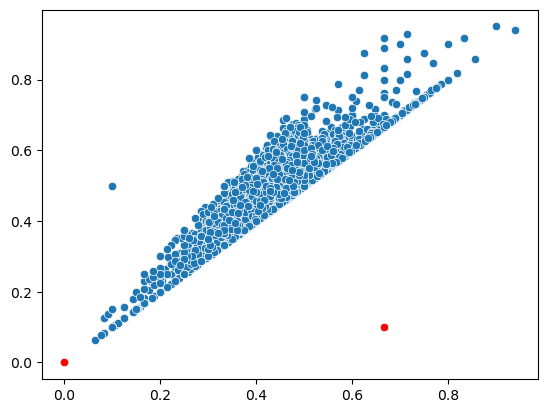

In [15]:
outlier_index=np.where(SVM_Class==1)
outlier_values=X[outlier_index]

sns.scatterplot(x=X[:,0], y=X[:,1])
sns.scatterplot(x=outlier_values[:,0], y=outlier_values[:,1], color='r')

In [16]:
SVM_Class=OneClassSVM(kernel='poly', degree=1, gamma='auto', tol=0.0001, nu=0.30000000000000004).fit(X_scaled)
df_PTS_eFG['outlier_score_SVM_PTS_eFG%']=SVM_Class.decision_function(X_scaled)*-1
df_PTS_eFG['outlier_score_SVM_PTS_eFG%']=df_PTS_eFG['outlier_score_SVM_PTS_eFG%'].rank()
df_PTS_eFG.sort_values('outlier_score_SVM_PTS_eFG%', ascending=True).head()

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\4083825606.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_SVM_PTS_eFG%']=SVM_Class.decision_function(X_scaled)*-1
C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\4083825606.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_PTS_eFG['outlier_score_SVM_PTS_eFG%']=df_PTS_eFG['outlier_score_SVM_PTS_eFG%'].rank()


,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,PG%,SG%,SF%,PF%,C%,OnCourt,On-Off,BadPass,LostBall,Shooting_Fouls_Committed,Offensive_Fouls_Committed,Shooting_Fouls_Drawn,Offensive_Fouls_Drawn,PGA,And1,Blkd,Year,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader,Starting%_float,Starting%_str,Decades,outlier_score_elliptic_PTS_eFG%,outlier_score_LOF_PTS_eFG%,outlier_score_SVM_PTS_eFG%
12403,David Stockton,PG,26,Utah Jazz,3,0,9,2,3,0.667,2,3,0.667,0,0,0.0,0.1,4,4,0.10,0,0,0,0,0,0,1,3,10,33.9,0.050,0.1,0.333,0.0,0.0,0.0,0.0,0.0,0.0,17.4,28.8,0.1,0.0,0.1,0.459,6.7,1.1,7.9,0.0,1.0,0.00,0.00,0.00,0.0,-55.0,-59.9,1,0,3,0,1,0,0,0,0,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,1.0,1.0,1.0
7689,Marcus Banks,PG,29,Toronto Raptors,3,0,22,0,2,0.000,0,0,0.000,0,2,0.0,0.0,6,8,0.75,0,1,1,3,1,0,2,4,6,6.8,0.543,0.0,0.000,0.0,5.5,2.7,17.2,2.3,0.0,26.6,15.3,0.0,0.0,0.0,0.011,-6.6,0.1,-6.5,0.0,1.0,0.00,0.00,0.00,0.0,15.8,22.8,2,0,1,0,3,1,7,0,0,2011,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0
12229,Erik McCree,SF,24,Utah Jazz,4,0,8,0,2,0.000,0,1,0.000,0,1,0.0,0.0,0,0,0.00,0,1,1,0,1,0,1,0,0,-8.9,0.000,0.5,0.000,0.0,14.0,7.1,0.0,6.3,0.0,33.3,16.9,-0.1,0.0,-0.1,-0.334,-14.7,1.0,-13.7,0.0,0.0,0.56,0.37,0.07,0.0,-35.3,-40.1,0,1,0,0,0,0,0,0,1,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0
14906,Feron Hunt,SF,22,New York Knicks,2,0,8,0,2,0.000,0,0,0.000,0,2,0.0,0.0,0,0,0.00,1,0,1,1,1,0,1,1,0,-3.0,0.000,0.0,0.000,13.2,0.0,6.7,16.0,6.3,0.0,33.3,16.4,-0.1,0.0,0.0,-0.234,-12.3,1.0,-11.3,0.0,0.0,0.00,0.90,0.10,0.0,-1.1,-1.4,0,0,1,0,0,0,2,0,0,2022,0,0,0,0,0,0,0,0.0,0.0%,2020's,96.0,6285.0,96.0
12210,Tyler Lydon,PF,21,Denver Nuggets,1,0,2,0,0,0.000,0,0,0.000,0,0,0.0,0.0,0,0,0.00,0,0,0,0,0,0,0,0,0,0.0,0.000,0.0,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.014,-3.9,-1.6,-5.4,0.0,0.0,0.00,0.00,1.00,0.0,-125.0,-126.3,0,0,0,0,0,0,0,0,0,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0


### Isolation Forest

In [ ]:
from sklearn.ensemble import IsolationForest
#again we will build our own hyperparameter tuning loop
param_n_estimator=[]
param_max_samples=[]
param_max_features=[]
param_bootstrap=[]
best_score_IsoForest=[]

for n_estimator in [50,100,200,300,500]:
    for max_samples in ['auto',50,100,200,300,500]:
            for max_features in np.linspace(0.1,1,5,dtype=float):
                for bootstrap in [True,False]:
                    IsoPred=IsolationForest(n_estimators=n_estimator, max_samples=max_samples, contamination=0.025,
                                            max_features=max_features, bootstrap=bootstrap,random_state=101).fit_predict(X)
                    best_score_IsoForest.append(round(silhouette_score(X,IsoPred),5))
                    param_n_estimator.append(n_estimator)
                    param_max_samples.append(max_samples)
                    param_max_features.append(max_features)
                    param_bootstrap.append(bootstrap)

best_value_IsoForest=best_score_IsoForest.index(max(best_score_IsoForest))

print('The best score based on following parameter: {}'.format(max(best_score_IsoForest)))
print('\n')
print('Best value for the n_estimator hyperparameter: {}'.format(param_n_estimator[best_value_IsoForest]))
print('\n')
print('Best value for the max_sampels hyperparameter: {}'.format(param_max_samples[best_value_IsoForest]))
print('\n')
print('Best value for the max_features hyperparameter: {}'.format(param_max_features[best_value_IsoForest]))
print('\n')
print('Best value for the bootstrap hyperparameter: {}'.format(param_bootstrap[best_value_IsoForest]))

The best score based on following parameter: 0.77457


Best value for the n_estimator hyperparameter: 100


Best value for the max_sampels hyperparameter: 100


Best value for the max_features hyperparameter: 1.0


Best value for the bootstrap hyperparameter: False


In [17]:
from sklearn.ensemble import IsolationForest
IsoPred=IsolationForest(n_estimators=100, max_samples=100,
                                            contamination=0.025,
                                            max_features=1.0,
                                            bootstrap=False,random_state=101).fit_predict(X)
s_score_IsoForest=round(silhouette_score(X,IsoPred),5)
print("Silhouette score for the IsolationForest model is: {}".format(s_score_IsoForest))

Silhouette score for the IsolationForest model is: 0.77457


<Axes: >

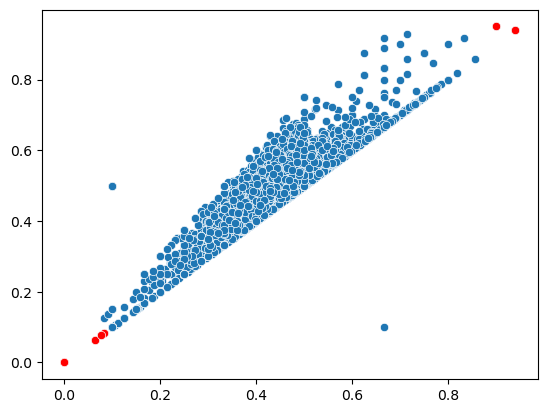

In [18]:
outlier_index=np.where(IsoPred==-1)
outlier_values=X[outlier_index]

sns.scatterplot(x=X[:,0], y=X[:,1])
sns.scatterplot(x=outlier_values[:,0], y=outlier_values[:,1], color='r')

In [39]:
IsoFor=IsolationForest(n_estimators=100, max_samples=100, contamination=0.025,max_features=1.0, bootstrap=False,random_state=101).fit(X)
df_PTS_eFG['outlier_score_IsoFor_PTS_eFG%']=IsoFor.decision_function(X)
df_PTS_eFG['outlier_score_IsoFor_PTS_eFG%']=df_PTS_eFG['outlier_score_SVM_PTS_eFG%'].rank()
df_PTS_eFG.sort_values('outlier_score_IsoFor_PTS_eFG%', ascending=True).head(15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\1106236916.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\1106236916.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,PER,TS%,3PAr,FTr,ORB%,DRB%,TRB%,AST%,STL%,BLK%,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP,PG%,SG%,SF%,PF%,C%,OnCourt,On-Off,BadPass,LostBall,Shooting_Fouls_Committed,Offensive_Fouls_Committed,Shooting_Fouls_Drawn,Offensive_Fouls_Drawn,PGA,And1,Blkd,Year,League Champion,Most Valuable Player,Rookie of the Year,PPG Leader,RPG Leader,APG Leader,Win Share Leader,Starting%_float,Starting%_str,Decades,outlier_score_elliptic_PTS_eFG%,outlier_score_LOF_PTS_eFG%,outlier_score_SVM_PTS_eFG%,outlier_score_IsoFor_PTS_eFG%,Outlier_Rank,PTS_eFG%_Outlier,Player_Year,FG%_eFG%_Outlier
12403,David Stockton,PG,26,Utah Jazz,3,0,9,2,3,0.667,2,3,0.667,0,0,0.0,0.1,4,4,0.10,0,0,0,0,0,0,1,3,10,33.9,0.050,0.100,0.333,0.0,0.0,0.0,0.0,0.0,0.0,17.4,28.8,0.1,0.0,0.1,0.459,6.7,1.1,7.9,0.0,1.0,0.00,0.00,0.00,0.00,-55.0,-59.9,1,0,3,0,1,0,0,0,0,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,1.0,1.0,1.0,1.0,350.0,non-outlier,David Stockton-2018,non-outlier
7689,Marcus Banks,PG,29,Toronto Raptors,3,0,22,0,2,0.000,0,0,0.000,0,2,0.0,0.0,6,8,0.75,0,1,1,3,1,0,2,4,6,6.8,0.543,0.000,0.000,0.0,5.5,2.7,17.2,2.3,0.0,26.6,15.3,0.0,0.0,0.0,0.011,-6.6,0.1,-6.5,0.0,1.0,0.00,0.00,0.00,0.00,15.8,22.8,2,0,1,0,3,1,7,0,0,2011,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0,96.0,95.0,outlier,Marcus Banks-2011,outlier
12229,Erik McCree,SF,24,Utah Jazz,4,0,8,0,2,0.000,0,1,0.000,0,1,0.0,0.0,0,0,0.00,0,1,1,0,1,0,1,0,0,-8.9,0.000,0.500,0.000,0.0,14.0,7.1,0.0,6.3,0.0,33.3,16.9,-0.1,0.0,-0.1,-0.334,-14.7,1.0,-13.7,0.0,0.0,0.56,0.37,0.07,0.00,-35.3,-40.1,0,1,0,0,0,0,0,0,1,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0,96.0,95.0,outlier,Erik McCree-2018,outlier
14906,Feron Hunt,SF,22,New York Knicks,2,0,8,0,2,0.000,0,0,0.000,0,2,0.0,0.0,0,0,0.00,1,0,1,1,1,0,1,1,0,-3.0,0.000,0.000,0.000,13.2,0.0,6.7,16.0,6.3,0.0,33.3,16.4,-0.1,0.0,0.0,-0.234,-12.3,1.0,-11.3,0.0,0.0,0.00,0.90,0.10,0.00,-1.1,-1.4,0,0,1,0,0,0,2,0,0,2022,0,0,0,0,0,0,0,0.0,0.0%,2020's,96.0,6285.0,96.0,96.0,95.0,outlier,Feron Hunt-2022,outlier
12210,Tyler Lydon,PF,21,Denver Nuggets,1,0,2,0,0,0.000,0,0,0.000,0,0,0.0,0.0,0,0,0.00,0,0,0,0,0,0,0,0,0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.014,-3.9,-1.6,-5.4,0.0,0.0,0.00,0.00,1.00,0.00,-125.0,-126.3,0,0,0,0,0,0,0,0,0,2018,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0,96.0,95.0,outlier,Tyler Lydon-2018,outlier
14902,Jay Huff,C,23,Los Angeles Lakers,4,0,20,0,3,0.000,0,2,0.000,0,1,0.0,0.0,0,0,0.00,1,3,4,1,1,1,1,1,0,0.6,0.000,0.667,0.000,5.4,16.1,10.8,5.9,2.4,4.5,25.0,8.6,-0.1,0.0,0.0,-0.117,-8.3,0.9,-7.4,0.0,0.0,0.00,0.00,0.00,1.00,31.5,34.8,0,1,1,0,0,1,3,0,0,2022,0,0,0,0,0,0,0,0.0,0.0%,2020's,96.0,6285.0,96.0,96.0,95.0,outlier,Jay Huff-2022,outlier
9846,Dexter Pittman,C,25,Atlanta Hawks,2,0,3,0,1,0.000,0,0,0.000,0,1,0.0,0.0,0,2,0.00,3,0,3,0,0,0,0,0,0,13.1,0.000,0.000,0.000,100.0,0.0,57.9,0.0,0.0,0.0,0.0,28.5,0.0,0.0,0.0,-0.180,1.8,-26.1,-24.3,0.0,0.0,0.00,0.00,0.00,1.00,0.0,0.3,0,0,0,0,1,0,0,0,0,2014,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0,96.0,95.0,outlier,Dexter Pittman-2014,outlier
15462,Sterling Brown,SF,27,Los Angeles Lakers,4,0,24,0,4,0.000,0,2,0.000,0,2,0.0,0.0,0,0,0.00,3,5,8,2,3,0,0,4,0,7.0,0.000,0.500,0.000,13.9,21.6,17.8,9.4,5.9,0.0,0.0,7.0,0.0,0.1,0.0,0.040,-7.7,4.3,-3.3,0.0,0.0,0.00,0.65,0.35,0.00,-3.0,-3.6,0,0,3,0,0,0,4,0,1,2023,0,0,0,0,0,0,0,0.0,0.0%,2020's,96.0,6285.0,96.0,96.0,95.0,outlier,Sterling Brown-2023,outlier
9480,Ronnie Brewer,SF,28,Chicago Bulls,1,0,2,0,0,0.000,0,0,0.000,0,0,0.0,0.0,0,0,0.00,0,0,0,0,0,0,0,0,0,0.0,0.000,0.000,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.029,-4.4,-3.9,-8.3,0.0,0.0,0.00,1.00,0.00,0.00,-70.0,-72.1,0,0,0,0,0,0,0,0,0,2014,0,0,0,0,0,0,0,0.0,0.0%,2010's,96.0,6285.0,96.0,96.0,95.0,outlier,Ronnie Brewer-2014,outlier
14897,Danuel House Jr.,SF,28,New York Knicks,1,0,3,0,1,0.000,0,1,0.000,0,0,0.0,0.0,0,0,0.00,0,0,0,0,0,0,0,0,0,-13.4,0.000,0.100,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14.6,0.0,0.0,0.0,

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2312552846.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2312552846.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_16456\2312552846.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

<Figure size 1000x800 with 0 Axes>

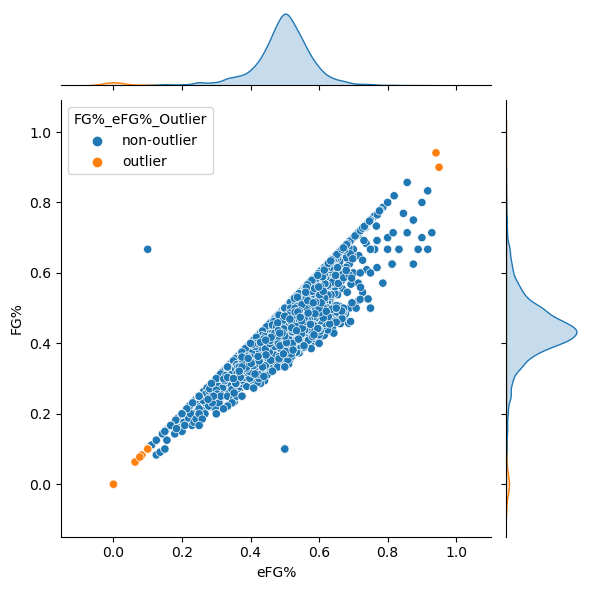

In [40]:
#creating a data frame with all the silhouette scores to get the best model, with the highest score will determine
model_silhouette_score={'elliptic':s_score_elliptic,'LOF':s_score_LOF,
                        'SVM_Class':s_score_svm,'IsoFor':s_score_IsoForest}
model_summary={'elliptic':elliptic,'LOF':LOF,
               'SVM_Class':SVM_Class,'IsoFor':IsoFor}

df_model_score=pd.DataFrame.from_dict(model_silhouette_score,orient='index').reset_index().rename(columns={'index':'Models',
                                                                            0:'Silhouette_Score'})
strongest_model=df_model_score[df_model_score['Silhouette_Score']==df_model_score['Silhouette_Score'].max()]['Models'].values[0]
best_model=model_summary[strongest_model].decision_function(X)

#here, we create a new data frame which will use the best model and showcase the outliers via the model
df_PTS_eFG=df_modern
df_PTS_eFG['Outlier_Rank']=best_model
df_PTS_eFG['Outlier_Rank']=df_PTS_eFG['Outlier_Rank'].rank()
df_PTS_eFG['FG%_eFG%_Outlier']=df_PTS_eFG['Outlier_Rank'].apply(lambda x: 'outlier' if x <= len(df_PTS_eFG)*0.025 else 'non-outlier')
df_PTS_eFG['Player_Year']=df_PTS_eFG['Player']+'-'+df_PTS_eFG['Year'].astype(str)
player_name=list(df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier']['Player_Year'])
plt.figure(figsize=(10,8))
sns.jointplot(x='eFG%', y='FG%', hue='FG%_eFG%_Outlier', data=df_PTS_eFG)

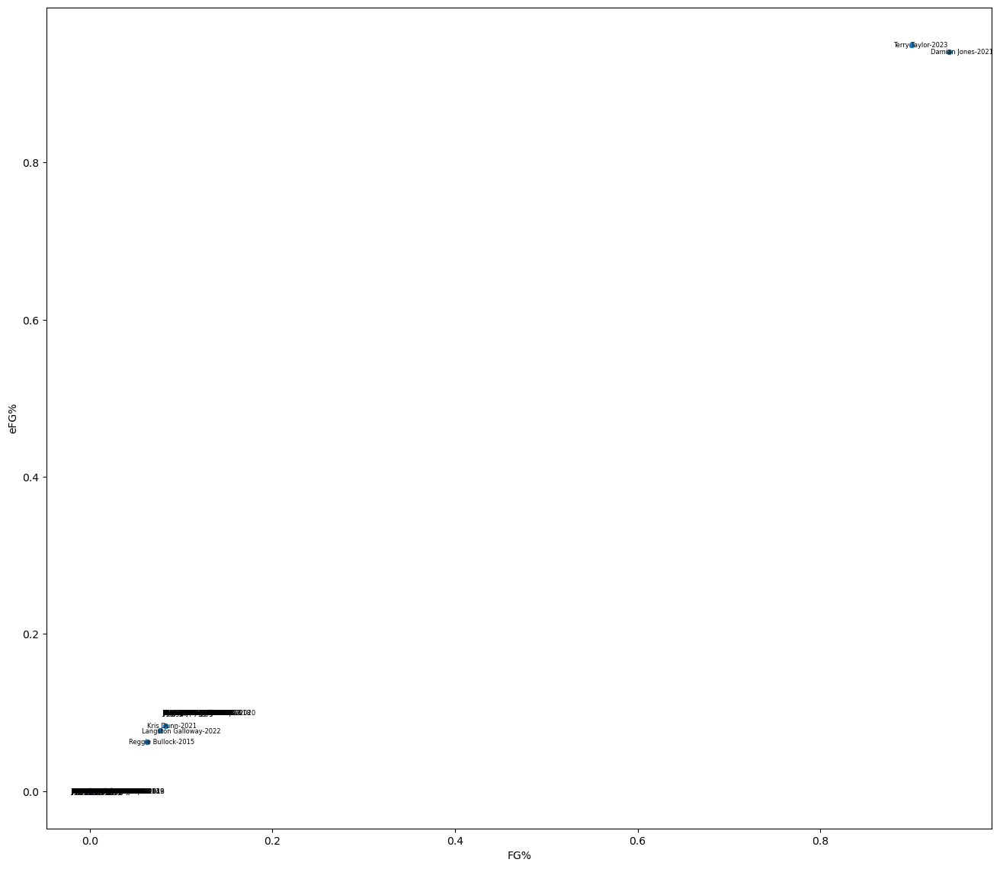

In [45]:
#plotting the outliers in a scatterplot
plt.figure(figsize=(16,14))
sns.scatterplot(x='FG%',y='eFG%',data=df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier'])
for i in range(len(df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier'])):
        plt.annotate(player_name[i], (list(df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier']['FG%'])[i]-0.02,
                                      list(df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier']['eFG%'])[i]-0.003), fontsize=6)

In [46]:
#using plotly to create a 
import plotly.express as px
plt.figure(figsize=(10,8))
px.scatter(x='FG%',y='eFG%',data_frame=df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier'],hover_name='Player_Year')

<Figure size 1000x800 with 0 Axes>

In [48]:
#number of outlier performances
numb_outlier=df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier'].groupby(['Player'])['FG%_eFG%_Outlier'].count().sort_values(
    ascending=False).to_frame().rename(columns={'FG%_eFG%_Outlier':'Numb_of_Outlier_Perfor_FG%_eFG%'}).reset_index()

#best overall outlier performance based on the categories
out_rank=df_PTS_eFG[df_PTS_eFG['FG%_eFG%_Outlier']=='outlier'].groupby(['Player'])['Outlier_Rank'].min().sort_values(
    ascending=True).to_frame().reset_index()

#final table
df_output_PTS_eFG=pd.merge(out_rank,numb_outlier,how='inner',on='Player').set_index('Player')
df_output_PTS_eFG.head(15)

,Outlier_Rank,Numb_of_Outlier_Perfor_FG%_eFG%
Player,,
Zylan Cheatham,95.0,1
Julian Champagnie,95.0,1
Tyler Ulis,95.0,1
Tyler Lydon,95.0,1
Justin Dentmon,95.0,1
Justin Hamilton,95.0,1
Justin Jackson,95.0,1
Juwan Morgan,95.0,1
Kalin Lucas,95.0,2


That was a complete run to get the outliers for the combination "FG%" and "eFG%" features. Doing that for each feature combination we want to analyse, would take too long. Therefore, we will create a def function, allowing us to do every step automatically.

In [6]:
def outlier_nba(df,feat1,feat2,per,top_numb):
    from sklearn.covariance import EllipticEnvelope
    from sklearn.neighbors import LocalOutlierFactor
    from sklearn.preprocessing import RobustScaler
    from sklearn.svm import OneClassSVM
    from sklearn.ensemble import IsolationForest
    from sklearn.metrics import silhouette_score
    import plotly.express as px

    #df=> data frame feature
    df_output=df

    #feat1=> input feature; feat2=> input feature
    X=df[[feat1,feat2]].values
    X_scaled=RobustScaler().fit_transform(X)

    #elliptic envelope model
    ##per=> contamination percentage
    elliptic=EllipticEnvelope(contamination=per, random_state=101).fit(X)
    elliptic_pred=elliptic.predict(X)
    s_score_elliptic=round(silhouette_score(X,elliptic_pred),5)


    #local outlier factor model
    first_param_n_neighbor=[]
    second_leaf_sizes=[]
    third_metric=[]

    best_score=[]
    for n_neighbor in np.linspace(5,200,7,dtype=int):
        for leaf_sizes in np.linspace(5,200,7,dtype=int):
            for metrics in ['euclidean','manhattan']:
                LOF_pred=LocalOutlierFactor(n_neighbors=n_neighbor,algorithm='auto',
                                            leaf_size=leaf_sizes,metric=metrics,contamination=per,novelty=False).fit_predict(X)
                best_score.append(round(silhouette_score(X,LOF_pred),5))
                first_param_n_neighbor.append(n_neighbor)
                second_leaf_sizes.append(leaf_sizes)
                third_metric.append(metrics)

    best_value=best_score.index(max(best_score))

    LOF_pred=LocalOutlierFactor(n_neighbors=first_param_n_neighbor[best_value],algorithm='auto',
                                            leaf_size=second_leaf_sizes[best_value],metric=third_metric[best_value],
                                contamination=per,novelty=False).fit_predict(X)
    s_score_LOF=round(silhouette_score(X,LOF_pred),5)
    LOF=LocalOutlierFactor(n_neighbors=first_param_n_neighbor[best_value],algorithm='auto',
                                            leaf_size=second_leaf_sizes[best_value],
                           metric=third_metric[best_value],contamination=per,novelty=True).fit(X)


    #svm model
    param_kernel=[]
    param_degree=[]
    param_gamma=[]
    param_tol=[]
    param_nu=[]
    best_score_svm=[]

    for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
        for degree in np.linspace(1,5,1,dtype=int):
            for gamma in ['auto','scale']:
                for tol in np.linspace(0.0001,0.1,3,dtype=float):
                    for nu in np.linspace(0.1,0.5,3,dtype=float):
                        SVM_Class=OneClassSVM(kernel=kernel, degree=degree, gamma=gamma, tol=tol, nu=nu).fit_predict(X_scaled)
                        best_score_svm.append(round(silhouette_score(X,SVM_Class),5))
                        param_kernel.append(kernel)
                        param_degree.append(degree)
                        param_gamma.append(gamma)
                        param_tol.append(tol)
                        param_nu.append(nu)

    best_value_svm=best_score_svm.index(max(best_score_svm))

    SVM_Class_pred=OneClassSVM(kernel=param_kernel[best_value_svm], degree=param_degree[best_value_svm],
                          gamma=param_gamma[best_value_svm], tol=param_tol[best_value_svm],
                          nu=param_nu[best_value_svm]).fit_predict(X_scaled)
    s_score_svm=round(silhouette_score(X,SVM_Class_pred),5)
    SVM_Class=OneClassSVM(kernel=param_kernel[best_value_svm], degree=param_degree[best_value_svm],
                          gamma=param_gamma[best_value_svm], tol=param_tol[best_value_svm],
                          nu=param_nu[best_value_svm]).fit(X_scaled)

    #Isolation Forest Model
    from sklearn.ensemble import IsolationForest
    param_n_estimator=[]
    param_max_samples=[]
    param_max_features=[]
    param_bootstrap=[]
    best_score_IsoForest=[]

    for n_estimator in [50,100,200,300]:
        for max_samples in ['auto',50,100,200,300]:
                for max_features in np.linspace(0.1,1,4,dtype=float):
                    for bootstrap in [True,False]:
                        IsoPred=IsolationForest(n_estimators=n_estimator, max_samples=max_samples, contamination=per,
                                                max_features=max_features, bootstrap=bootstrap,random_state=101).fit_predict(X)
                        best_score_IsoForest.append(round(silhouette_score(X,IsoPred),5))
                        param_n_estimator.append(n_estimator)
                        param_max_samples.append(max_samples)
                        param_max_features.append(max_features)
                        param_bootstrap.append(bootstrap)

    best_value_IsoForest=best_score_IsoForest.index(max(best_score_IsoForest))


    IsoPred=IsolationForest(n_estimators=param_n_estimator[best_value_IsoForest],
                            max_samples=param_max_samples[best_value_IsoForest],
                                                contamination=per,
                                                max_features=param_max_features[best_value_IsoForest],
                                                bootstrap=param_bootstrap[best_value_IsoForest]
                            ,random_state=101).fit_predict(X)
    s_score_IsoForest=round(silhouette_score(X,IsoPred),5)
    IsoFor=IsolationForest(n_estimators=param_n_estimator[best_value_IsoForest],
                           max_samples=param_max_samples[best_value_IsoForest],
                           contamination=per, max_features=param_max_features[best_value_IsoForest],
                           bootstrap=param_bootstrap[best_value_IsoForest],random_state=101).fit(X)

    #getting the best scoring model
    model_silhouette_score={'elliptic':s_score_elliptic,'LOF':s_score_LOF,
                            'SVM_Class':s_score_svm,'IsoFor':s_score_IsoForest}
    model_summary={'elliptic':elliptic,'LOF':LOF,
                   'SVM_Class':SVM_Class,'IsoFor':IsoFor}
    df_model_score=pd.DataFrame.from_dict(model_silhouette_score,orient='index').reset_index().rename(columns={'index':'Models',
                                                                                0:'Silhouette_Score'})
    strongest_model=df_model_score[df_model_score['Silhouette_Score']==df_model_score['Silhouette_Score'].max()]['Models'].values[0]
    if strongest_model=='SVM_Class':
        best_model=model_summary[strongest_model].decision_function(X_scaled)*-1
    else:
        best_model=model_summary[strongest_model].decision_function(X)

    df_feat1_feat2=df
    df_feat1_feat2['Outlier_Rank']=best_model
    df_feat1_feat2['Outlier_Rank']=df_feat1_feat2['Outlier_Rank'].rank()
    df_feat1_feat2['Outlier_Status']=df_feat1_feat2['Outlier_Rank'].apply(lambda x: 'outlier' if x <= len(df_feat1_feat2)*per else 'non-outlier')
    df_feat1_feat2['Player_Year']=df_feat1_feat2['Player']+'-'+df_feat1_feat2['Year'].astype(str)
    player_name=list(df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier']['Player_Year'])

    #displaying the outlying data points
    plt.figure(figsize=(10,8))
    sns.jointplot(x=feat1, y=feat2, hue='Outlier_Status', data=df_feat1_feat2)
    plt.show()

    #creating a scatterplot with the outliers
    plt.figure(figsize=(16,14))
    sns.scatterplot(x=feat1,y=feat2,data=df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'])
    for i in range(len(df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'])):
            plt.annotate(player_name[i], (list(df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'][feat1])[i]-0.02,
                                          list(df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'][feat2])[i]-0.03),
                         fontsize=6)
    plt.show()

    #interactive scatterplot of the outliers
    plt.figure(figsize=(10,8))
    fig=px.scatter(x=feat1,y=feat2,data_frame=df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'],hover_name='Player_Year')
    fig.show()

    #number of outlier performances
    numb_outlier=df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'].groupby(['Player'])['Outlier_Status'].count().sort_values(
        ascending=False).to_frame().rename(columns={'Outlier_Status':'Numb_of_Outlier_Perfor_{}_{}'.format(feat1,
                                                                                                feat2)}).reset_index()

    #best overall outlier performance
    out_rank=df_feat1_feat2[df_feat1_feat2['Outlier_Status']=='outlier'].groupby(['Player'])['Outlier_Rank'].min().sort_values(
        ascending=True).to_frame().reset_index()

    #final table
    #top_numb=> will determine how many outlier will be displayed
    #here we get the ranking in ascending order and how many times a player had a outlying performance
    df_output=pd.merge(out_rank,numb_outlier,how='inner',on='Player').set_index('Player')
    return df_output.head(top_numb)

# Total Stats Outlier Analysis

It is important to mention that we are focusing mainly on the good performers. Therefore, we will select percentage values representing average performances, and we want to find those who performed above these levels.

C:\Users\gandj\AppData\Local\Temp\ipykernel_37704\2042339392.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feat1_feat2['Outlier_Rank']=best_model
C:\Users\gandj\AppData\Local\Temp\ipykernel_37704\2042339392.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feat1_feat2['Outlier_Rank']=df_feat1_feat2['Outlier_Rank'].rank()
C:\Users\gandj\AppData\Local\Temp\ipykernel_37704\2042339392.py:133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

<Figure size 1000x800 with 0 Axes>

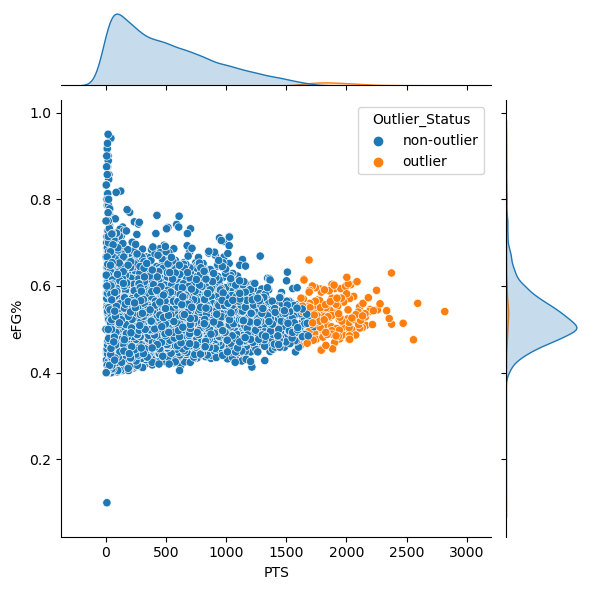

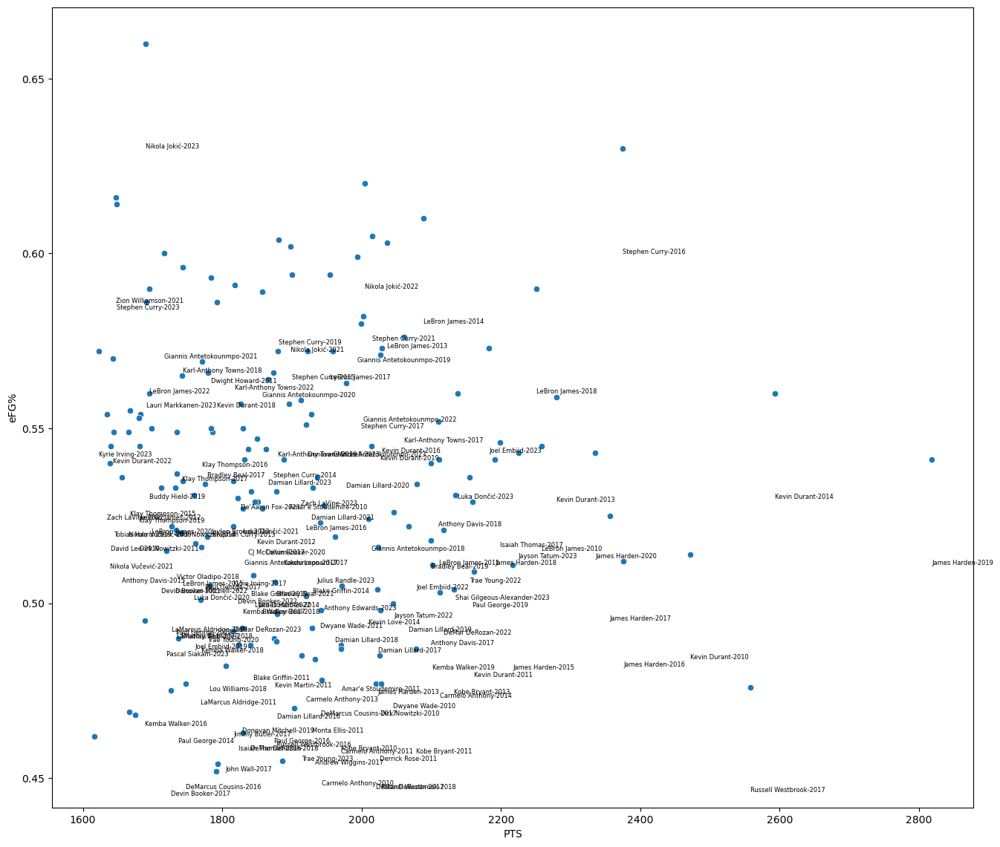

,Outlier_Rank,Numb_of_Outlier_Perfor_PTS_eFG%
Player,,
Stephen Curry,1.0,8
Nikola Jokić,2.5,3
LeBron James,2.5,11
Joel Embiid,6.0,3
Giannis Antetokounmpo,8.5,7
Karl-Anthony Towns,13.0,4
Kevin Durant,13.0,9
Damian Lillard,13.0,7
Dwight Howard,25.0,1


<Figure size 1000x800 with 0 Axes>

In [8]:
#showcasting outliers when comparing players that make 40% or more of their field goals based on PTS & eFG%
outlier_nba(df_modern[df_modern['FG%']>=0.4],'PTS','eFG%',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feat1_feat2['Outlier_Rank']=best_model
C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_feat1_feat2['Outlier_Rank']=df_feat1_feat2['Outlier_Rank'].rank()
C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

<Figure size 1000x800 with 0 Axes>

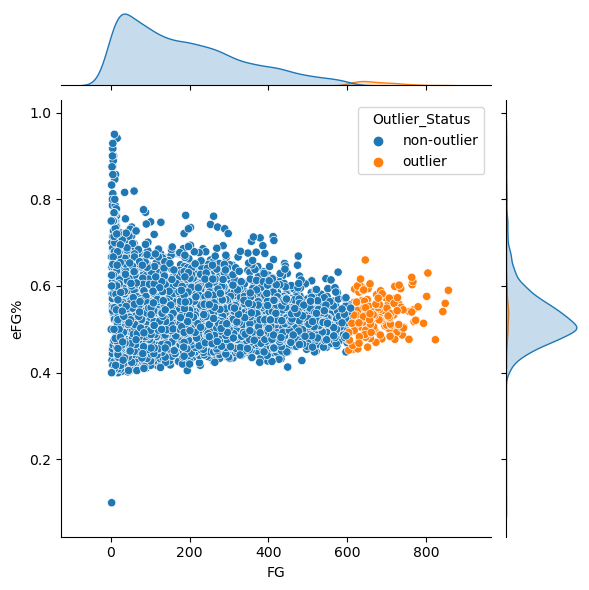

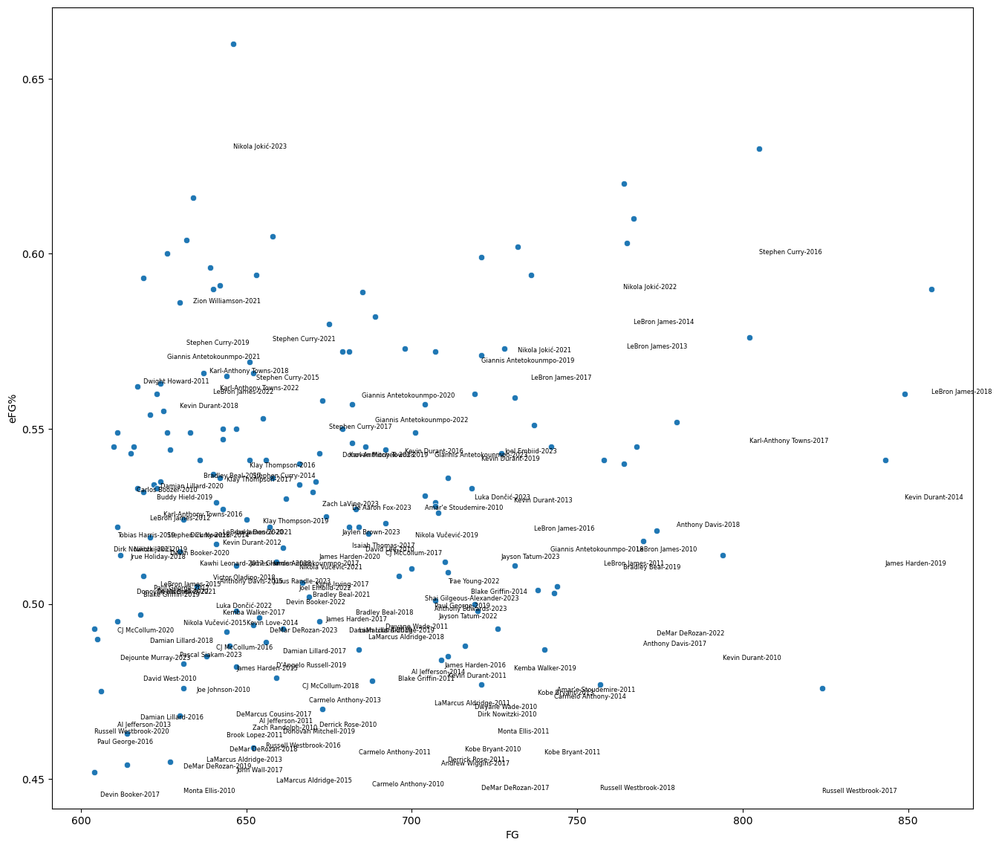

,Outlier_Rank,Numb_of_Outlier_Perfor_FG_eFG%
Player,,
LeBron James,1.0,11
Kevin Durant,2.0,8
James Harden,3.0,6
Russell Westbrook,4.0,8
Karl-Anthony Towns,5.0,5
Stephen Curry,7.0,7
Anthony Davis,8.0,3
DeMar DeRozan,9.0,7
Bradley Beal,12.0,4


<Figure size 1000x800 with 0 Axes>

In [7]:
#showcasting outliers when comparing players that make 40% or more of their field goals based on FG & eFG%
outlier_nba(df_modern[df_modern['FG%']>=0.4],'FG','eFG%',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

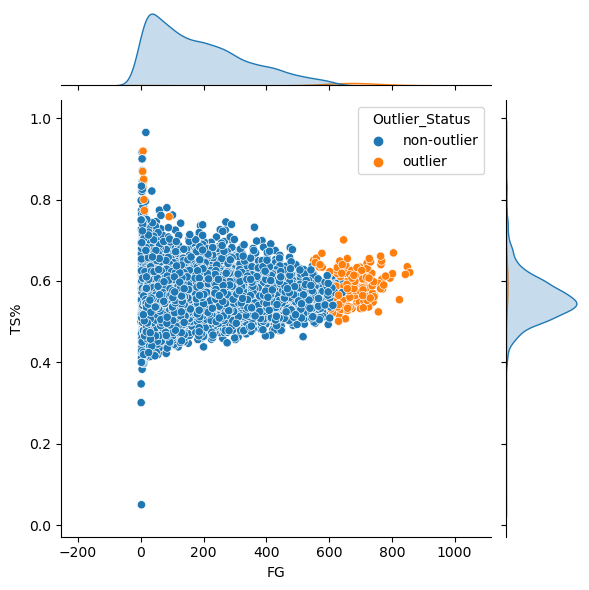

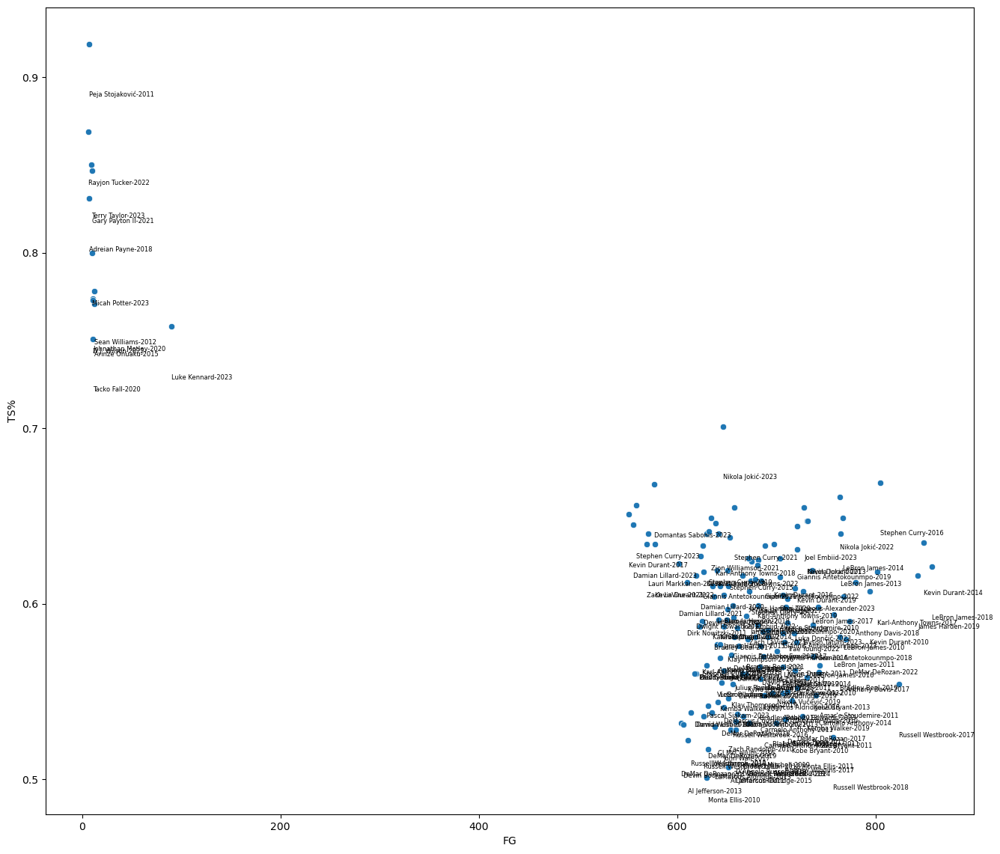

,Outlier_Rank,Numb_of_Outlier_Perfor_FG_TS%
Player,,
Nikola Jokić,1.0,3
Stephen Curry,2.0,8
Joel Embiid,6.0,2
LeBron James,6.0,9
Kevin Durant,6.0,10
Giannis Antetokounmpo,6.0,7
Karl-Anthony Towns,14.5,5
Domantas Sabonis,16.0,1
Shai Gilgeous-Alexander,21.5,1


<Figure size 1000x800 with 0 Axes>

In [32]:
#showcasting outliers when comparing players that make 40% or more of their field goals based on FG & TS%
outlier_nba(df_modern[df_modern['FG%']>=0.4],'FG','TS%',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

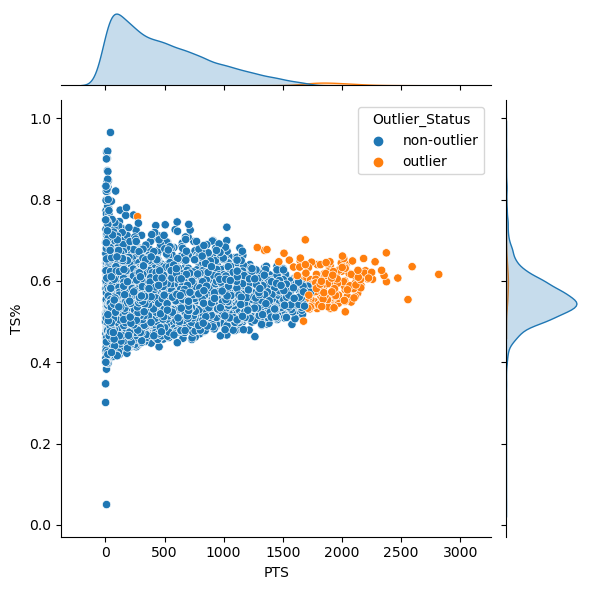

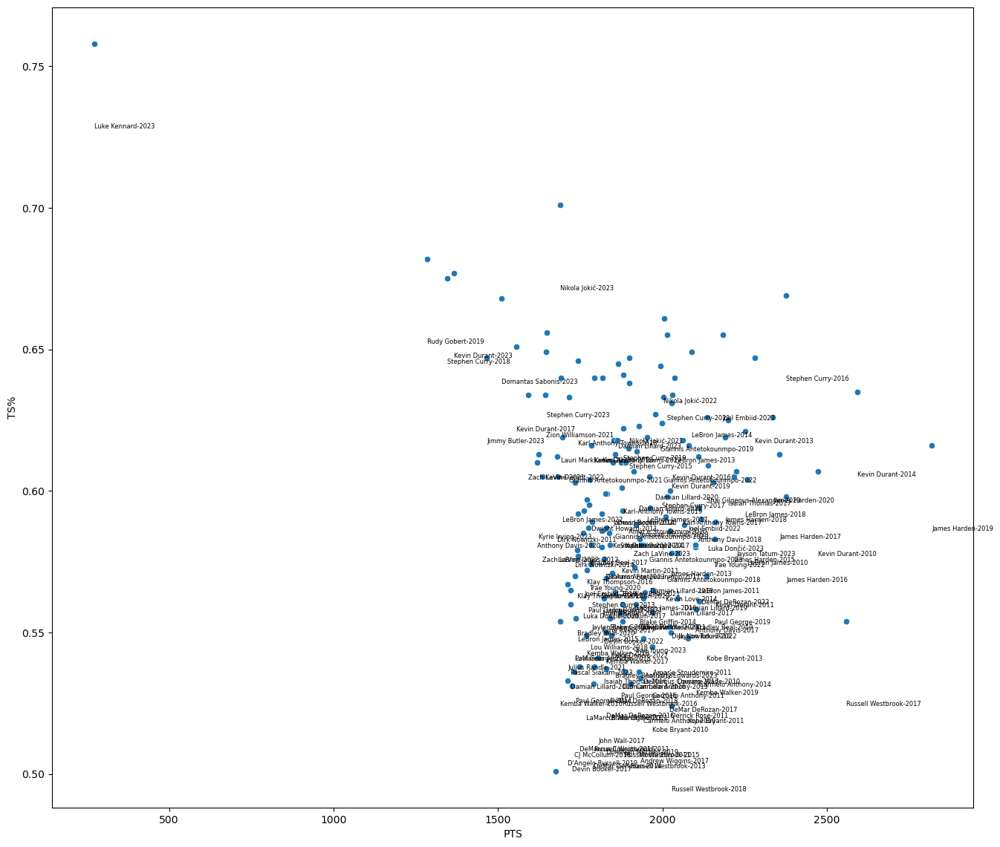

,Outlier_Rank,Numb_of_Outlier_Perfor_PTS_TS%
Player,,
Stephen Curry,1.0,9
James Harden,2.5,8
Isaiah Thomas,2.5,2
Kevin Durant,5.0,11
Joel Embiid,5.0,3
LeBron James,7.0,10
Shai Gilgeous-Alexander,8.0,1
Giannis Antetokounmpo,15.0,7
Nikola Jokić,15.0,3


<Figure size 1000x800 with 0 Axes>

In [9]:
#showcasting outliers when comparing players that make 40% or more of their field goals based on PTS & TS%
outlier_nba(df_modern[df_modern['FG%']>=0.4],'PTS','TS%',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

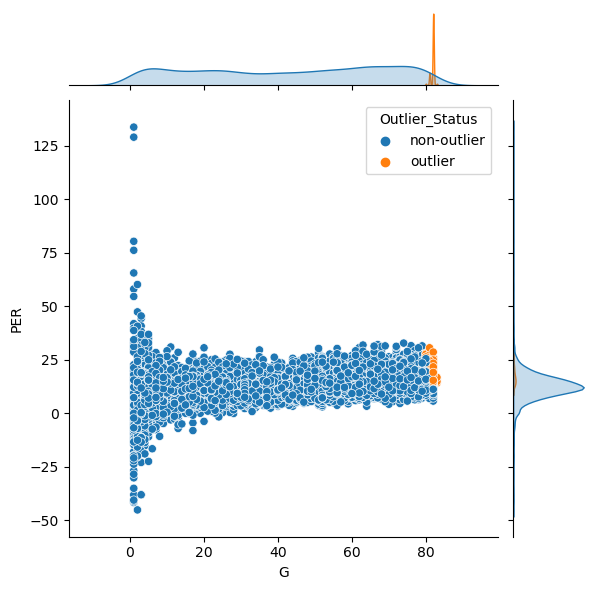

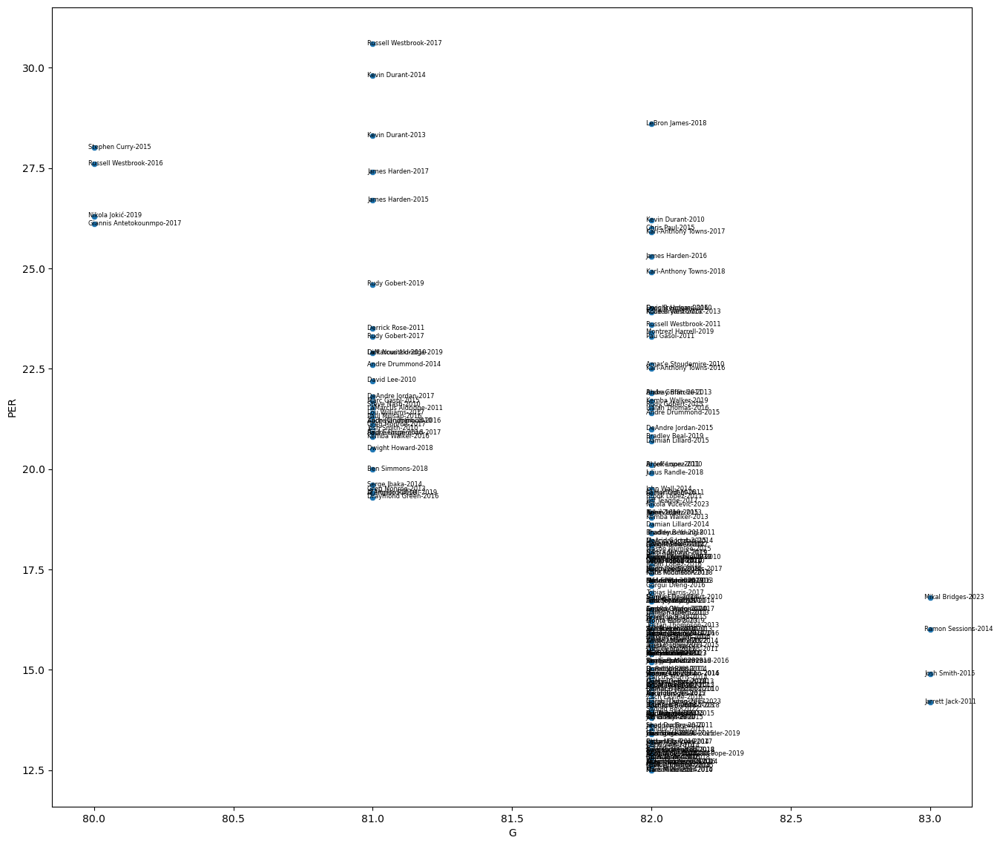

,Outlier_Rank,Numb_of_Outlier_Perfor_G_PER
Player,,
LeBron James,1.0,1
Kevin Durant,2.0,3
Chris Paul,3.0,1
Karl-Anthony Towns,4.0,3
James Harden,5.0,4
Enes Freedom,7.5,1
Dwight Howard,7.5,2
Kobe Bryant,9.5,1
Russell Westbrook,9.5,5


<Figure size 1000x800 with 0 Axes>

In [10]:
#showcasting outliers when comparing players based on G & PER
## G=> Games Played
outlier_nba(df_modern,'G','PER',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

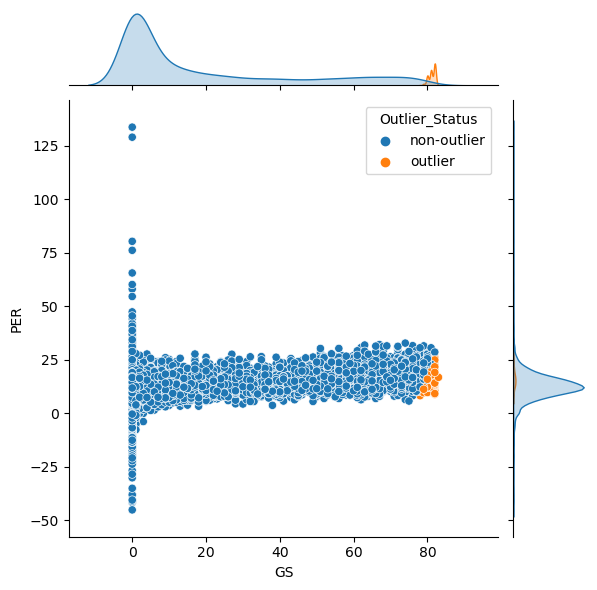

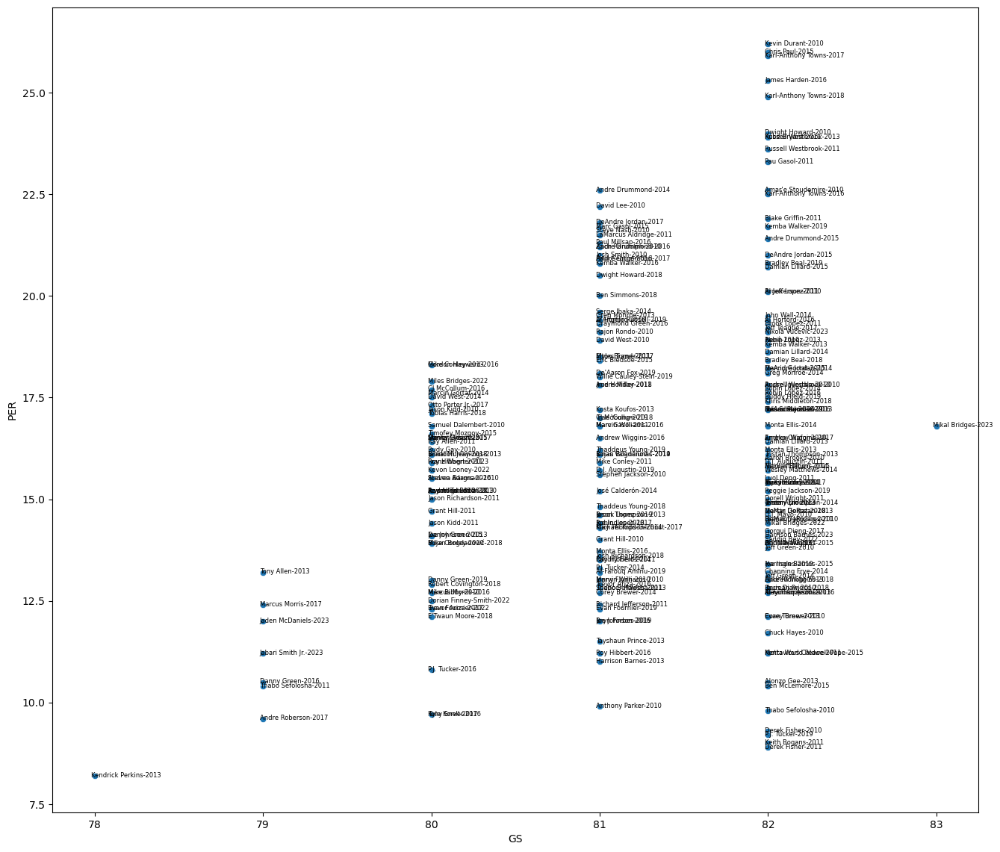

,Outlier_Rank,Numb_of_Outlier_Perfor_GS_PER
Player,,
Derek Fisher,1.0,2
Keith Bogans,2.0,1
P.J. Tucker,3.0,3
Thabo Sefolosha,5.0,3
Ben McLemore,6.0,1
Alonzo Gee,7.0,1
Kentavious Caldwell-Pope,8.5,1
Metta World Peace,8.5,1
Chuck Hayes,10.0,1


<Figure size 1000x800 with 0 Axes>

In [11]:
#showcasting outliers when comparing players based on GS & PER
## GS=> Games Started
outlier_nba(df_modern,'GS','PER',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

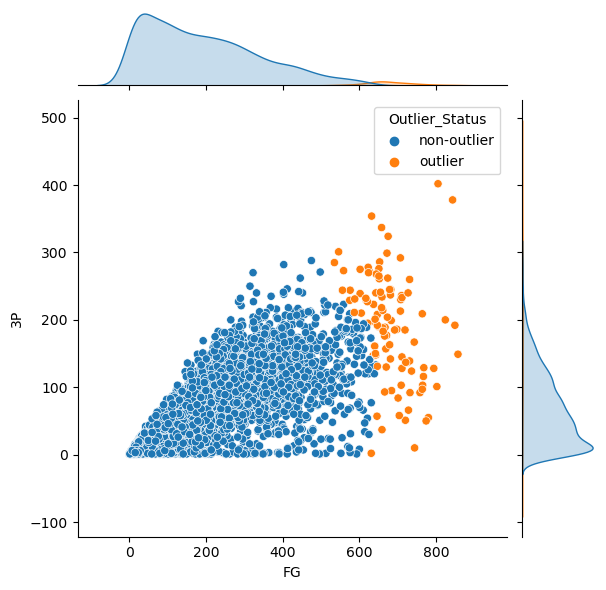

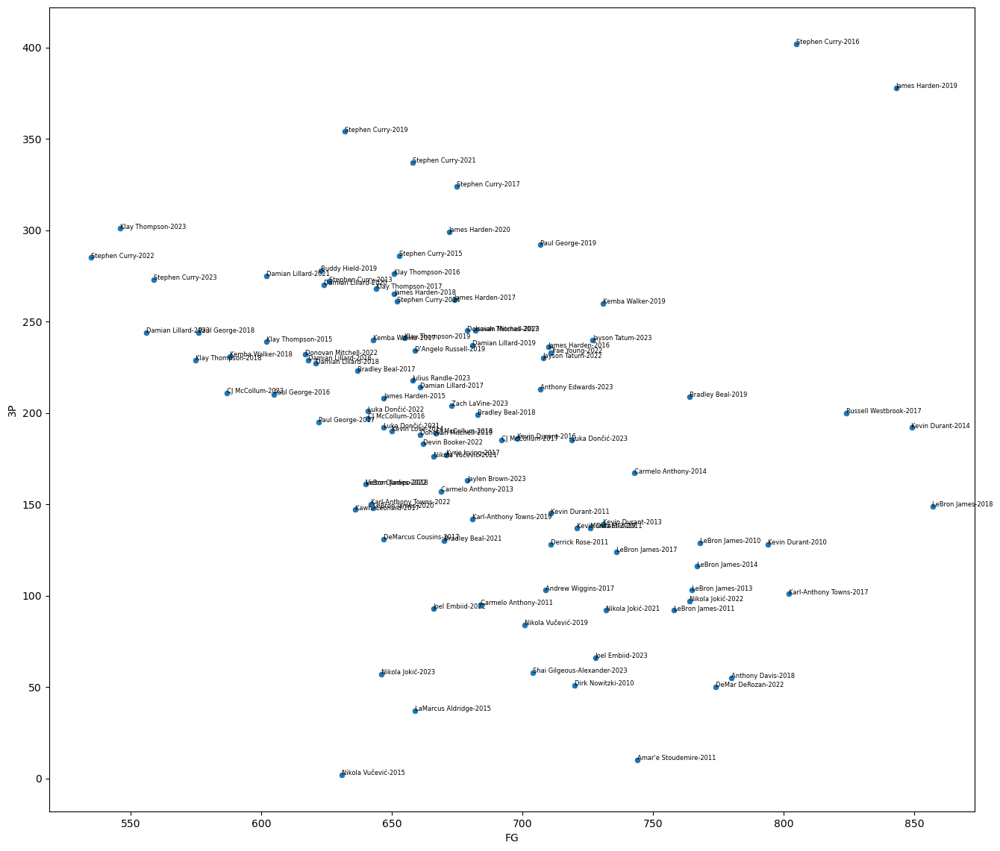

,Outlier_Rank,Numb_of_Outlier_Perfor_FG_3P
Player,,
James Harden,1.0,6
Stephen Curry,2.0,9
Klay Thompson,7.0,6
Paul George,7.0,4
Kemba Walker,10.5,3
Jayson Tatum,15.5,2
Isaiah Thomas,15.5,1
Donovan Mitchell,15.5,3
Damian Lillard,21.5,7


<Figure size 1000x800 with 0 Axes>

In [12]:
#showcasting outliers when comparing players that make 30% or more of their three point shots based on FG & 3P
outlier_nba(df_modern[df_modern['3P%']>=0.33],'FG','3P',0.025,15)

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:131: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:132: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\gandj\AppData\Local\Temp\ipykernel_20388\2042339392.py:133: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

<Figure size 1000x800 with 0 Axes>

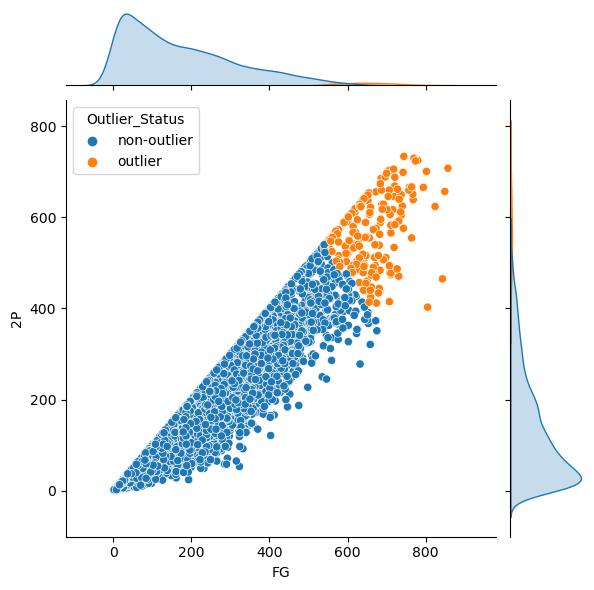

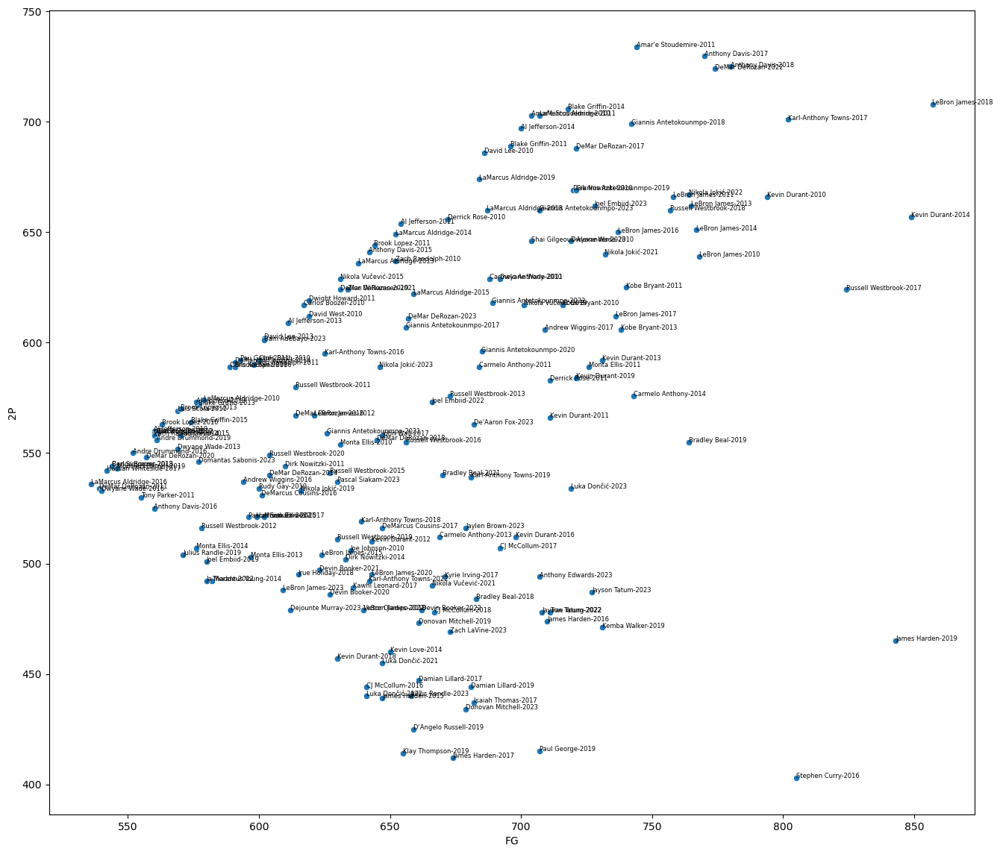

,Outlier_Rank,Numb_of_Outlier_Perfor_FG_2P
Player,,
LeBron James,1.5,12
Karl-Anthony Towns,1.5,5
Kevin Durant,3.5,8
Anthony Davis,5.0,4
DeMar DeRozan,6.5,9
Nikola Jokić,9.5,4
Amar'e Stoudemire,12.5,2
Russell Westbrook,12.5,9
Giannis Antetokounmpo,14.0,7


<Figure size 1000x800 with 0 Axes>

In [16]:
#showcasting outliers when comparing players that make 30% or more of their two point shots based on FG & 2P
outlier_nba(df_modern[df_modern['2P%']>=0.40],'FG','2P',0.025,15)

## Summary

After analyzing the different features, we were able to find the outlying performances. In this analysis, we have mainly focused on the modern NBA because the analysis is more practical with current data than data from previous decades. Of course, previous decades can also give great insight into the current NBA. Still, as we have already discovered, the old and modern NBA are different when it comes to offence and defence, and in this analysis, we have mainly focused on offence-related features. Therefore, it was important to analyze the old and modern NBA separately.

To recap, we have created a def function that allows us to select the best-performing model based on the data/feature combination we have chosen for the analysis. We get only positive outliers by filtering the data frame to showcase the values on or above the corresponding feature category's average, offence or defence. What is a positive outlier? The analysis is supposed to show the overachiever; filtering the data to showcase only the player on or above a calculated average can easily find a true overachiever.